# (25) Dataloder -- & Dataset

**Motivation**: Create dataloaders, next I will be ready to fit. <br>

In [1]:
# HIDE CODE


import os, sys
from copy import deepcopy as dc
from os.path import join as pjoin
from IPython.display import display, IFrame, HTML

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
extras_dir = pjoin(git_dir, 'jb-MTMST/_extras')
fig_base_dir = pjoin(git_dir, 'jb-MTMST/figs')
tmp_dir = pjoin(git_dir, 'jb-MTMST/tmp')

# GitHub
sys.path.insert(0, pjoin(git_dir, '_MTMST'))
from figures.fighelper import *
from model.opticflow import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
from rich.jupyter import print
%matplotlib inline
set_style()

## Trainer

In [2]:
from model.vae2d import VAE
from model.train import TrainerVAE

from torch import _dynamo
_dynamo.config.cache_size_limit = 1024

In [3]:
vae = VAE(ConfigVAE(
    n_kers=4,
    n_latent_scales=3, n_groups_per_scale=20, n_latent_per_group=3,
    n_pre_blocks=0, n_post_cells=3, n_cells_per_cond=2,
    ada_groups=True, spectral_norm=False, scale_init=True,
))
tr = TrainerVAE(
    model=torch.compile(vae),
    # model=vae,
    cfg=ConfigTrain(
        lr=0.001, batch_size=512, epochs=1000, grad_clip=1000,
        lambda_anneal=True, lambda_norm=1e-2, optimizer_kws={'eps': 1e-8},
        kl_beta=0.25, kl_anneal_cycles=1),
    device='cuda:1',
)
vae.cfg.total_latents()

105

In [4]:
vae.print()
vae.scales

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|     VAE     |  10.9 Mil  |
|     ---     |    ---     |
|     stem    |   1.1 K    |
|     pre     |     0      |
|  enc_tower  |  5.6 Mil   |
| enc_sampler |  1.3 Mil   |
| dec_sampler |  1.3 Mil   |
|    expand   |   52.7 K   |
|  dec_tower  |  2.6 Mil   |
|     post    |   10.3 K   |
|     out     |    290     |
|  cos_recon  |     0      |
|   l2_recon  |     0      |
|   l1_recon  |     0      |
|  l1_weight  |     0      |
+-------------+------------+

[16, 8, 4]

In [5]:
vae.latent_scales()[1]

{'idx-0_scale-4_group-0': range(0, 3),
 'idx-1_scale-4_group-1': range(3, 6),
 'idx-2_scale-4_group-2': range(6, 9),
 'idx-3_scale-4_group-3': range(9, 12),
 'idx-4_scale-4_group-4': range(12, 15),
 'idx-5_scale-8_group-0': range(15, 18),
 'idx-6_scale-8_group-1': range(18, 21),
 'idx-7_scale-8_group-2': range(21, 24),
 'idx-8_scale-8_group-3': range(24, 27),
 'idx-9_scale-8_group-4': range(27, 30),
 'idx-10_scale-8_group-5': range(30, 33),
 'idx-11_scale-8_group-6': range(33, 36),
 'idx-12_scale-8_group-7': range(36, 39),
 'idx-13_scale-8_group-8': range(39, 42),
 'idx-14_scale-8_group-9': range(42, 45),
 'idx-15_scale-16_group-0': range(45, 48),
 'idx-16_scale-16_group-1': range(48, 51),
 'idx-17_scale-16_group-2': range(51, 54),
 'idx-18_scale-16_group-3': range(54, 57),
 'idx-19_scale-16_group-4': range(57, 60),
 'idx-20_scale-16_group-5': range(60, 63),
 'idx-21_scale-16_group-6': range(63, 66),
 'idx-22_scale-16_group-7': range(66, 69),
 'idx-23_scale-16_group-8': range(69, 72),


In [6]:
len(vae.all_conv_layers), len(vae.all_log_norm)

(229, 225)

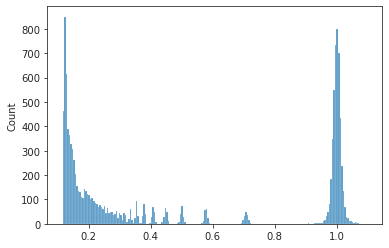

In [7]:
all_norm = torch.cat(vae.all_log_norm)
all_norm = torch.exp(all_norm)
sns.histplot(to_np(all_norm), bins=200);

In [9]:
tr.optim

Adamax (
Parameter Group 0
    betas: (0.9, 0.999)
    differentiable: False
    eps: 1e-08
    foreach: None
    initial_lr: 0.001
    lr: 0.001
    maximize: False
    weight_decay: 0.0001
)

## Review train options

In [10]:
print(f"VAE:\t\t{vae.cfg.name()}\nTrainer:\t{tr.cfg.name()}")

VAE:            k-32_z-3x[5,10,20]_cells-2_post-1x3
Trainer:        ep1000-b512-lr(0.001)_beta(0.25)-anneal(1x0.3)_lambda(0.01)_grad(1000)

## Train

In [11]:
comment = f"eps:1e-8_SmartInit_{tr.cfg.name()}"
tr.train(comment=comment)

epoch # 1000, avg loss: 15.682149: 100%|██████████| 1000/1000 [21:14:23<00:00, 76.46s/it]  


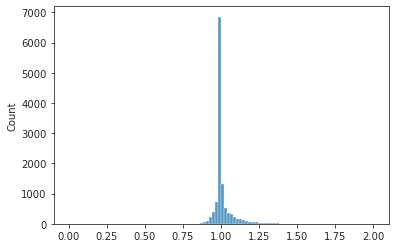

In [16]:
all_norm = [torch.exp(n.ravel()) for n in vae.all_log_norm]
all_norm = to_np(torch.cat(all_norm))
sns.histplot(all_norm, bins=np.linspace(0, 2, 101));

In [17]:
np.max(all_norm), 100 * (all_norm > 2).sum() / len(all_norm)

(4.9246836, 0.041555851063829786)

In [20]:
vae.cfg.name()

'k-32_z-3x[5,10,20]_cells-2_post-1x3'

In [21]:
val, loss = tr.validate(n_samples=4096)
{k: v.mean() for k, v in loss.items()}

{'kl': 39.90088,
 'l1': 0.6387789,
 'l2': 0.2325653,
 'epe': 2.4324937,
 'cos': 4.3491006}

fig/sample

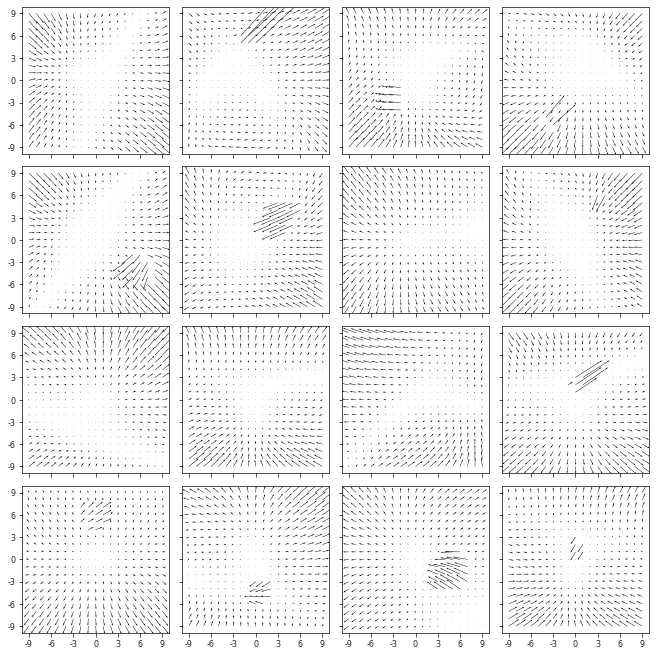

fig/corr_z

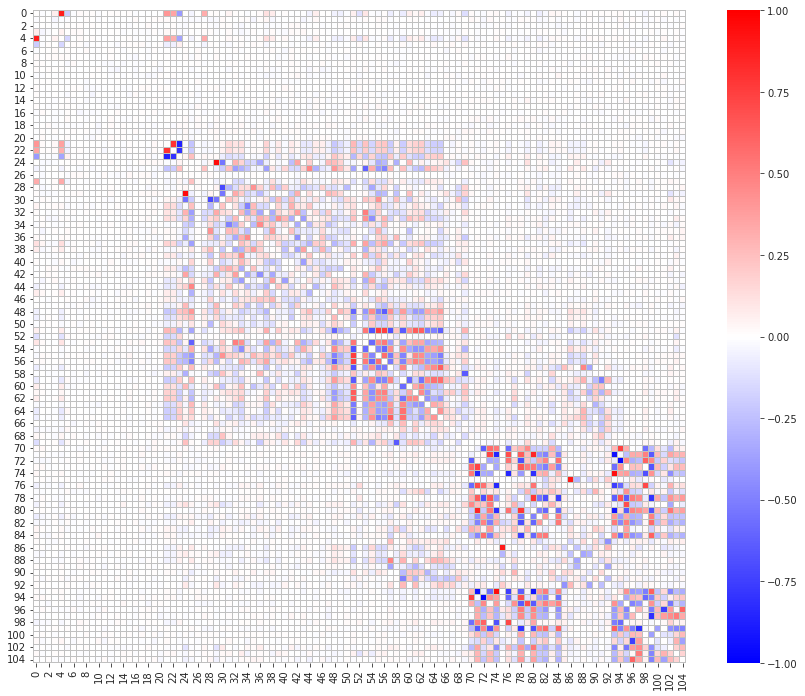

fig/regression

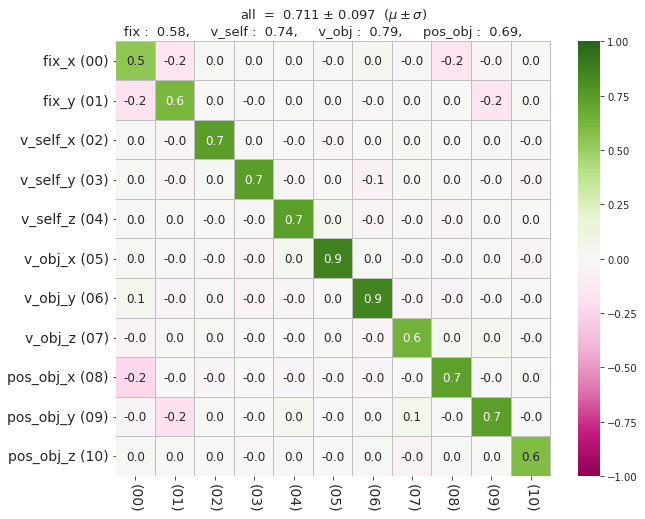

fig/mutual_info

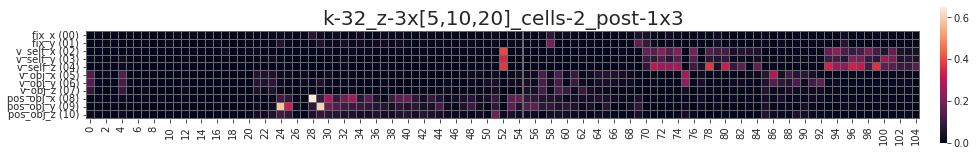

fig/hist_z

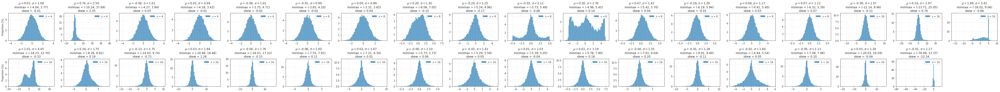

fig/hist_x_sample

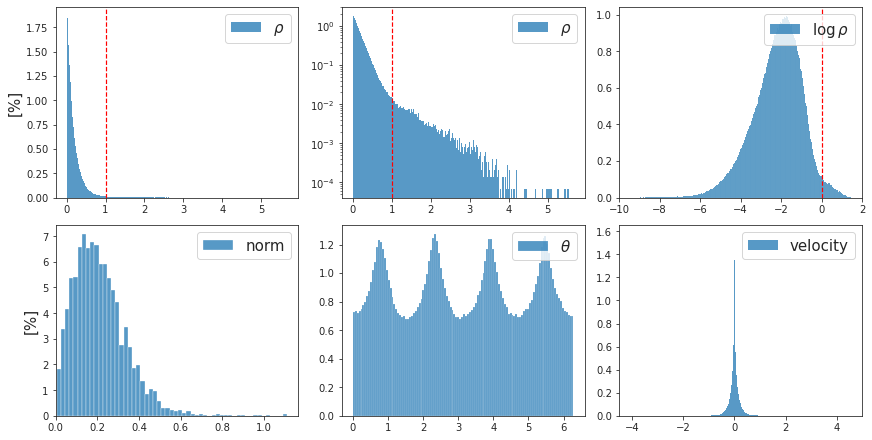

In [22]:
for k, v in val.items():
    if 'fig' in k:
        print(k)
        display(v)

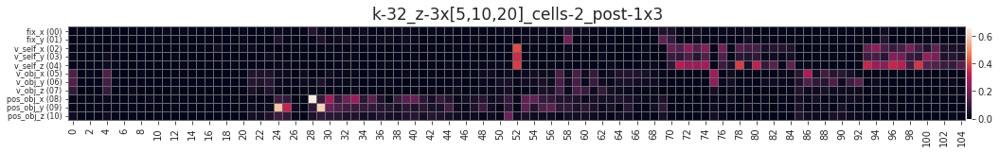

In [45]:
fig

In [46]:
np.max(val['regr/mi'])

0.6713483691859432

<AxesSubplot:ylabel='Count'>

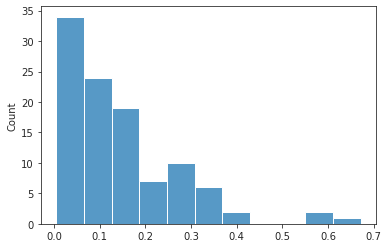

In [48]:
sns.histplot(np.max(val['regr/mi'], axis=0))

In [53]:
np.max(val['regr/mi'], 0).mean()

0.14003636836795005

In [54]:
np.diag(val['regr/r']).mean()

0.7105391976296257

fig/sample

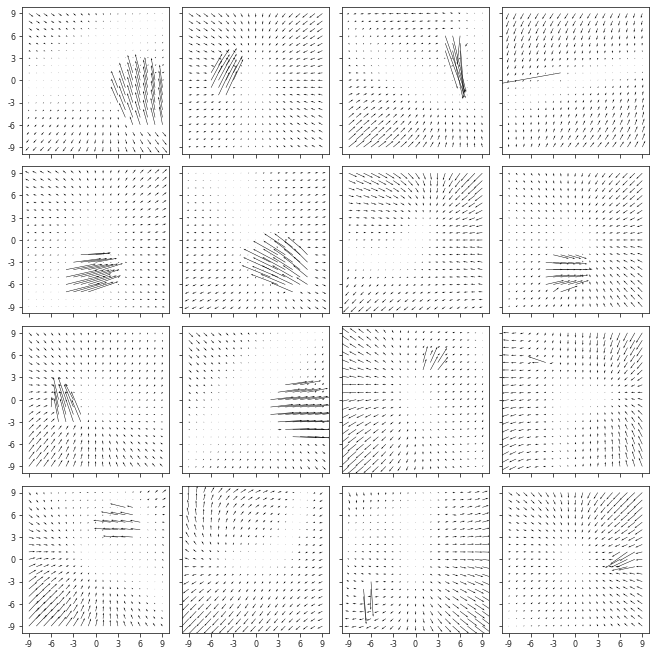

fig/corr_z

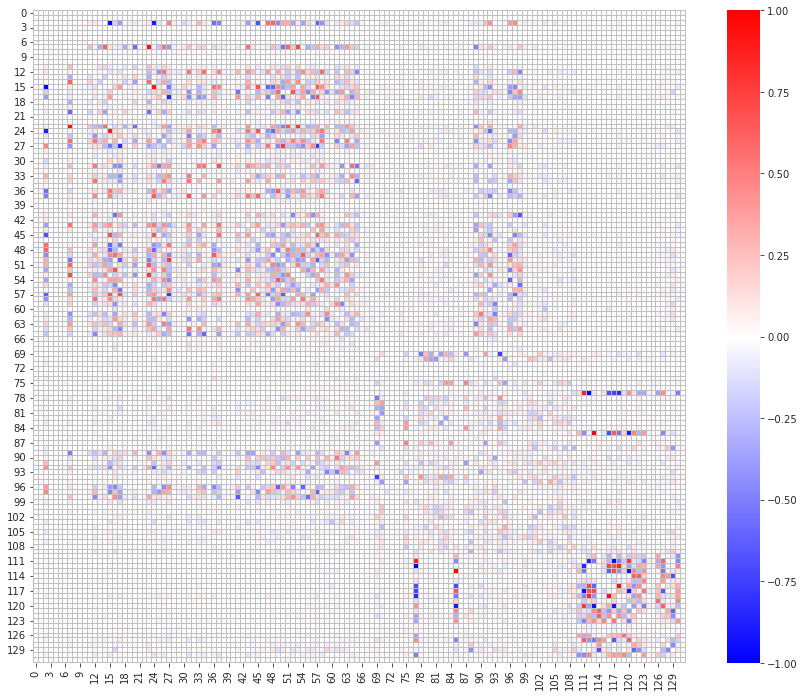

fig/regression

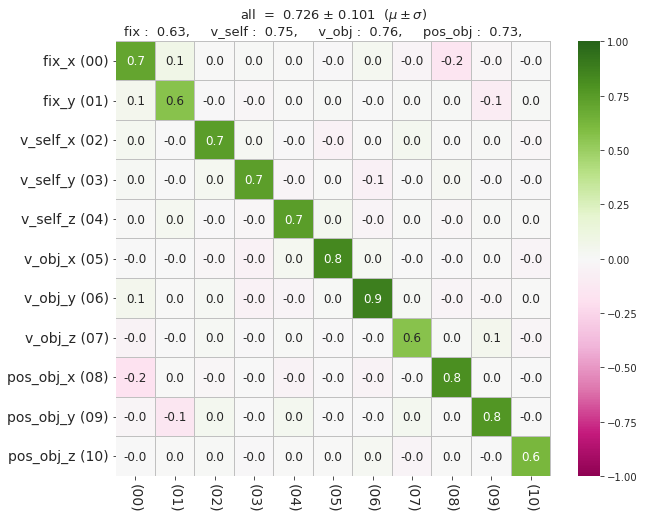

fig/mutual_info

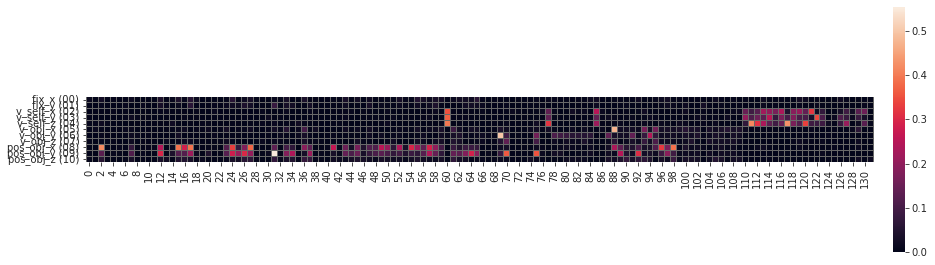

fig/hist_z

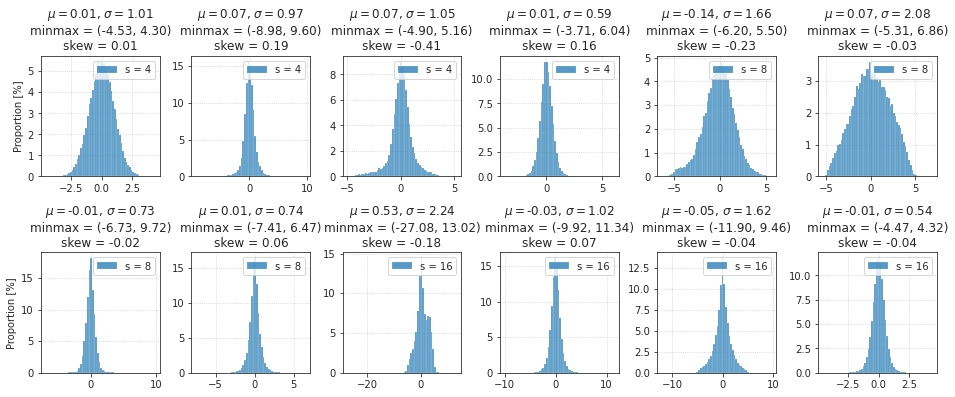

fig/hist_x_sample

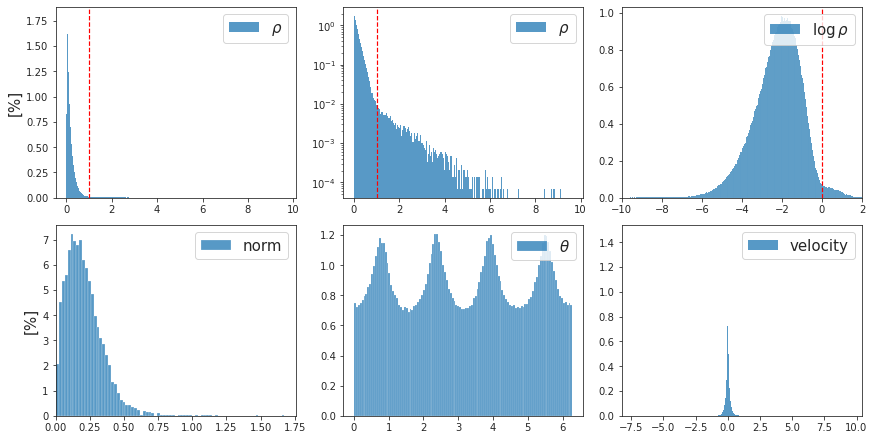

0.7105391976296257

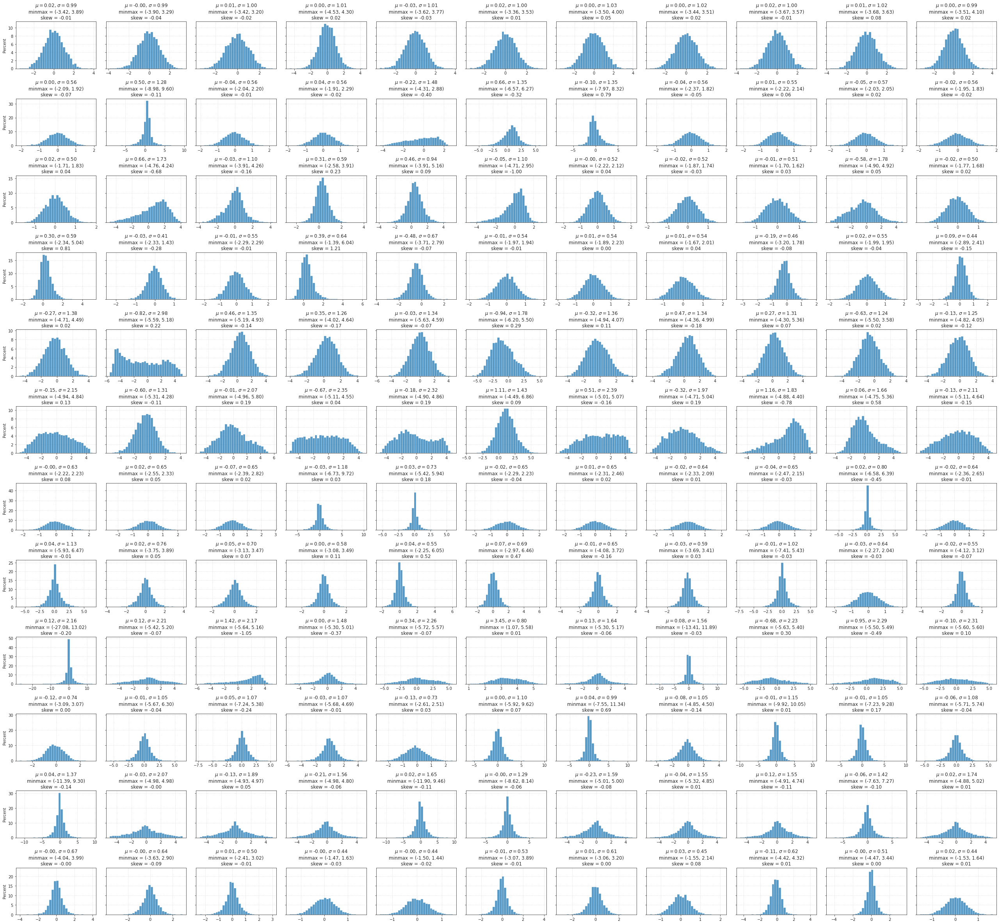

CPU times: user 26.6 s, sys: 720 ms, total: 27.3 s
Wall time: 27.3 s


In [47]:
%%time

_ = plot_latents_hist_full(
    z=val['z_sample'],
    scales=vae.latent_scales()[0],
    constrained_layout=False,
    tight_layout=True,
)

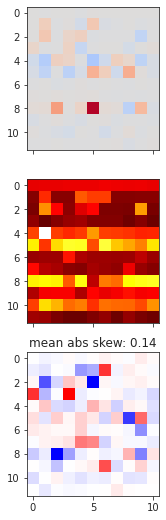

In [49]:
z = val['z_sample']
scales=vae.latent_scales()[0]
a = z.reshape((len(z), len(scales), -1))
nrows, ncols = a.shape[1:]
looper = itertools.product(
    range(nrows), range(ncols))
mu = np.zeros((nrows, ncols))
std = np.zeros((nrows, ncols))
skew = np.zeros((nrows, ncols))
for i, j in looper:
    x = a[:, i, j]
    mu[i, j] = x.mean()
    std[i, j] = x.std()
    skew[i, j] = sp_stats.skew(x)

    
fig, axes = create_figure(3, 1, (22, 9), 'all', 'all')
axes[0].imshow(mu, vmin=-3, vmax=3, cmap='coolwarm')
axes[1].imshow(std, vmin=0, cmap='hot')
axes[2].imshow(skew, vmin=-1, vmax=1, cmap='bwr')
axes[2].set_title(f"mean abs skew: {np.abs(skew).mean():0.2f}")
plt.show()

In [19]:
print(vae.cfg.get_name())

k-64_z-11x[4,4,4]_cells-3_post-1x3

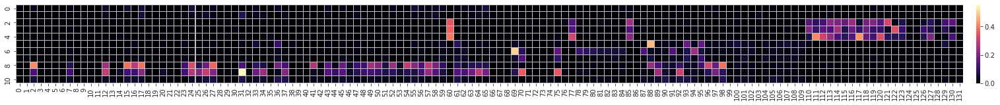

(<Figure size 5040x158.4 with 2 Axes>, <AxesSubplot:>)

In [20]:
show_heatmap(val['regr/mi'], vmin=0, vmax=None, cmap='magma',
             annot=False, cbar_kws={'pad': 0.005}, figsize=(70, 2.2))

In [21]:
val['regr/mi'].shape

(11, 132)

In [22]:
mi = val['regr/mi']
mi.shape

(11, 132)

In [23]:
scales, level_ids = vae.latent_scales()

In [24]:
level_ids

{'group-0_scale-4_0': range(0, 11),
 'group-1_scale-4_1': range(11, 22),
 'group-2_scale-4_2': range(22, 33),
 'group-3_scale-4_3': range(33, 44),
 'group-4_scale-8_0': range(44, 55),
 'group-5_scale-8_1': range(55, 66),
 'group-6_scale-8_2': range(66, 77),
 'group-7_scale-8_3': range(77, 88),
 'group-8_scale-16_0': range(88, 99),
 'group-9_scale-16_1': range(99, 110),
 'group-10_scale-16_2': range(110, 121),
 'group-11_scale-16_3': range(121, 132)}

In [25]:
mi_scales = np.zeros((len(mi), len(level_ids)))
for j, (key, ids) in enumerate(level_ids.items()):
    for i, x in enumerate(mi):
        mi_scales[i, j] = x[ids].sum() / x.sum()
mi_scales.shape

(11, 12)

In [26]:
names = tr.dl_tst.dataset.factor_names
_ty = [f"{e} ({i:02d})" for i, e in names.items()]
_tx = [e.split('_')[1] for e in level_ids]

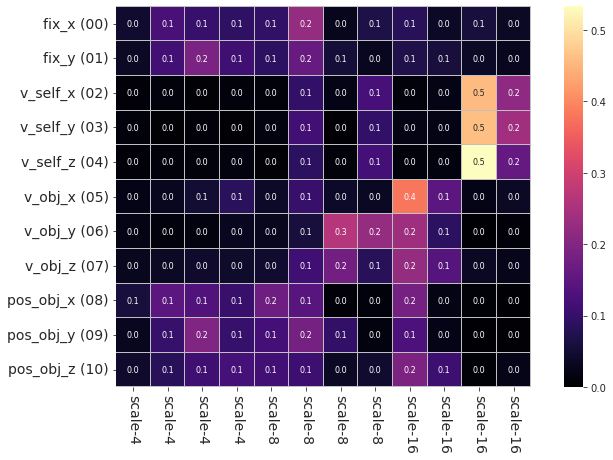

In [28]:
show_heatmap(
    r=mi_scales,
    vmin=0,
    vmax=None,
    yticklabels=_ty,
    xticklabels=_tx,
    cmap='magma',
    figsize=(12, 7),
);

In [29]:
mi_scales2 = np.zeros((len(mi), len(vae.cfg.groups)))
for j, s in enumerate(np.unique(scales)):
    _ids = []
    for k, ids in level_ids.items():
        if f'scale-{s}' in k:
            _ids.extend(list(ids))
    for i, x in enumerate(mi):
        mi_scales2[i, j] = x[_ids].sum() / x.sum()

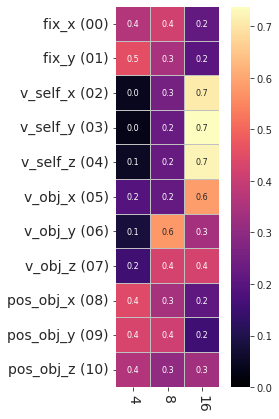

In [30]:
show_heatmap(
    r=mi_scales2,
    vmin=0,
    vmax=None,
    yticklabels=_ty,
    xticklabels=np.unique(scales),
    cmap='magma',
    figsize=(4, 7),
);

In [50]:
u, s, v = sp_lin.svd(
    a=val['z_sample'],
    full_matrices=False,
    compute_uv=True,
)
s *= 100 / s.sum()
u.shape, s.shape, v.shape

((4096, 132), (132,), (132, 132))

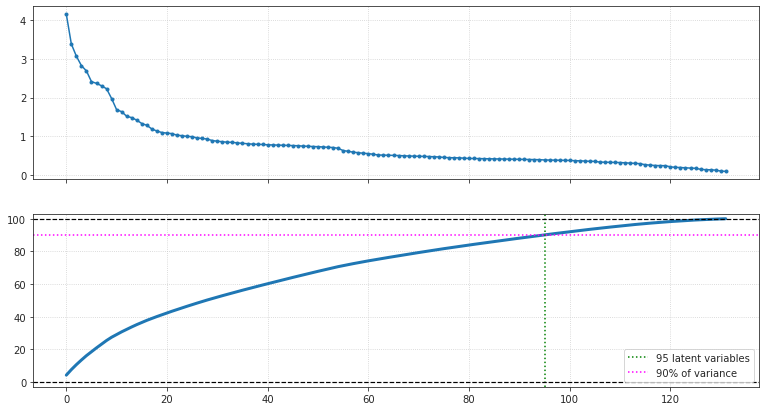

In [60]:
fig, axes = create_figure(2, 1, (13, 7), sharex='all')
axes[0].plot(s, marker='.')
axes[1].plot(np.cumsum(s), lw=3, marker=None)

idx = np.where(np.cumsum(s) > 90)[0][0]
axes[1].axvline(
    idx, color='g', ls=':', lw=1.5,
    label=f'{idx} latent variables',
)
axes[1].axhline(
    90, color='magenta', ls=':', lw=1.5,
    label=f'{90}% of variance',
)
axes[1].legend()

axes[1].axhline(0, color='k', ls='--', lw=1.2)
axes[1].axhline(100, color='k', ls='--', lw=1.2)
axes[1].set_ylim((-3, 103))
add_grid(axes)
plt.show()


In [31]:
x, norm = next(iter(tr.dl_tst))
x, norm = tr.to([x, norm])
w = 1 / norm

In [32]:
tr.model.eval();
with torch.no_grad():
    y, *_ = tr.model(x)

In [36]:
l1 = tr.model.l1_recon(x, y)
l1 = torch.sum(l1, dim=[1, 2, 3])
l1_bal = l1 * w / w.mean()
l1_bal = to_np(l1_bal)
l1 = to_np(l1)
l1.shape

(512,)

In [37]:
np.argmax(l1)

200

In [38]:
np.argmax(l1_bal)

240

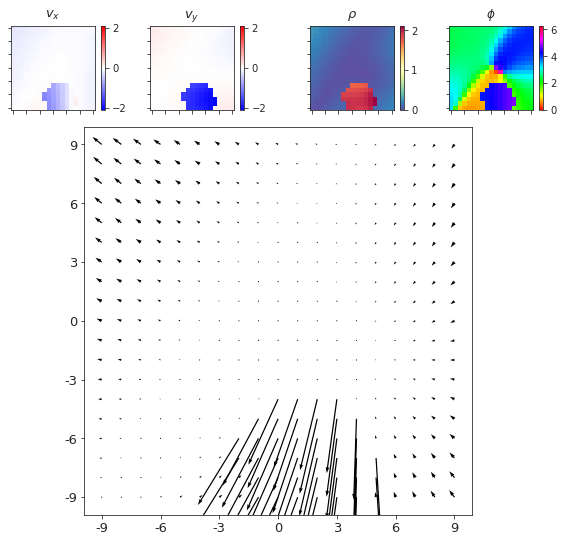

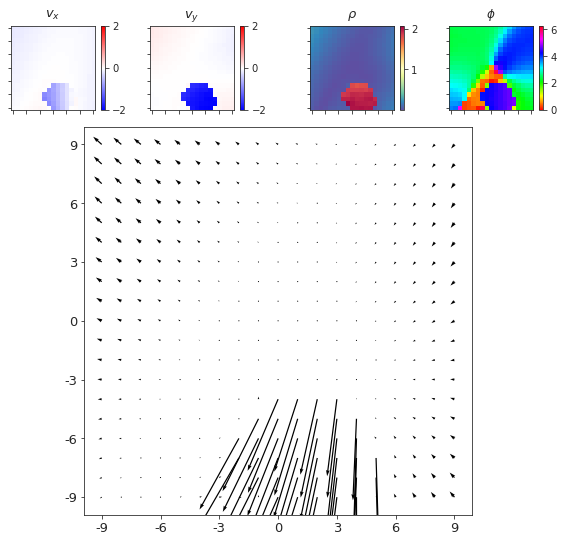

In [39]:
i = 240
show_opticflow_full(x[i])
show_opticflow_full(y[i]);

In [40]:
epe = endpoint_error(x, y)
epe_bal = epe * w / w.mean()
epe_bal = to_np(epe_bal)
np.argmax(epe_bal)

308

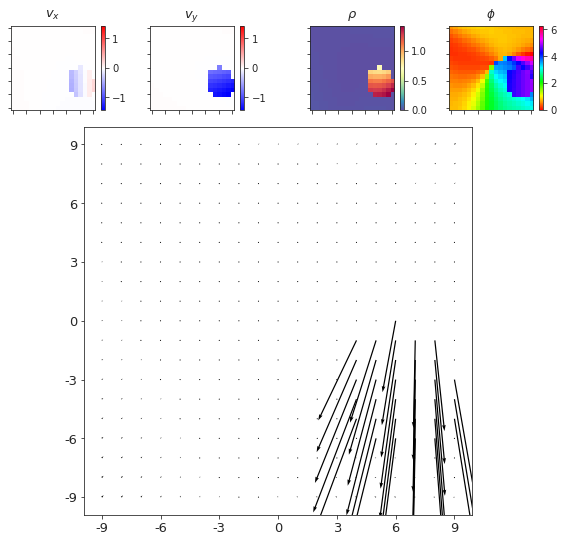

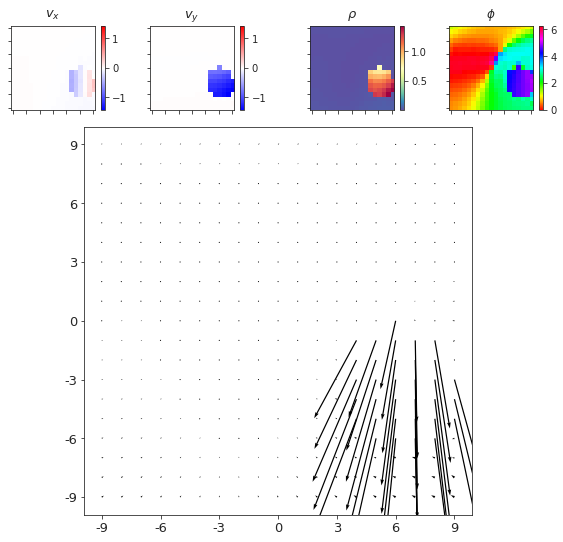

In [41]:
i = 308
show_opticflow_full(x[i])
show_opticflow_full(y[i]);

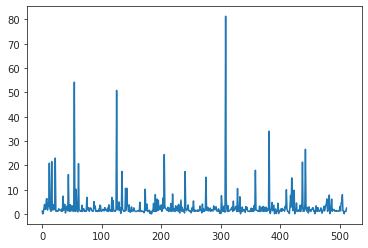

In [42]:
cos = 1 - tr.model.cos_recon(x, y)
cos = torch.sum(cos, dim=[1, 2])
cos = to_np(cos)
plt.plot(cos);

In [43]:
np.argmax(cos)

308

In [44]:
l2_true = vae.l2_recon(x, y)
l2_true = torch.sum(l2_true, dim=[1, 2, 3])
l2_true = l2_true * w / w.mean()
l2_true = to_np(l2_true)
l2_true.sum()

55.381554

In [45]:
l1_bal.sum(), l2_true.sum(), epe_bal.sum(), cos.sum()

(160.2891, 55.381554, 792.5137, 1506.6191)

In [46]:
np.argmax(l2_true)

240

In [81]:
np.argsort(epe_bal)[:5]

array([212,  66, 227, 183, 126])

In [82]:
epe_bal[212], epe[212]

(3.0300817, tensor(6.1240, device='cuda:1'))

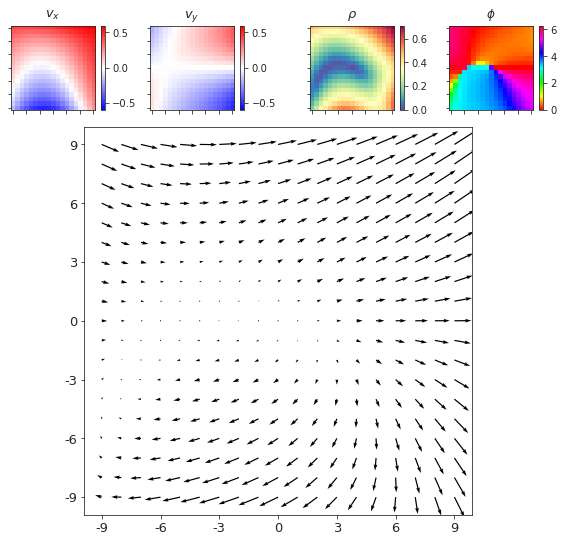

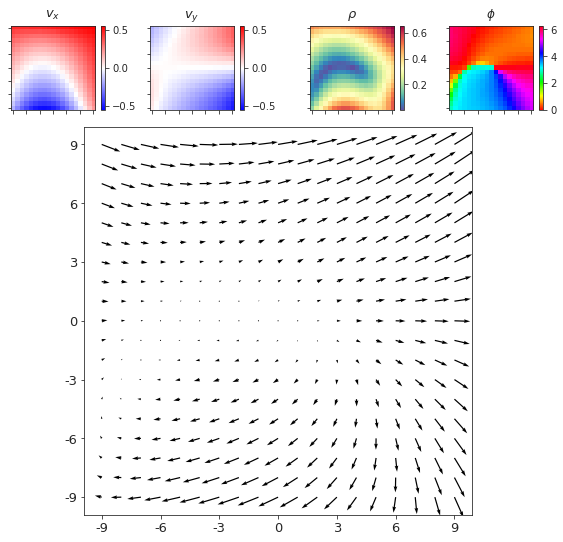

In [83]:
i = 212
show_opticflow_full(x[i])
show_opticflow_full(y[i]);

In [85]:
np.argsort(epe_bal)[-2]

204

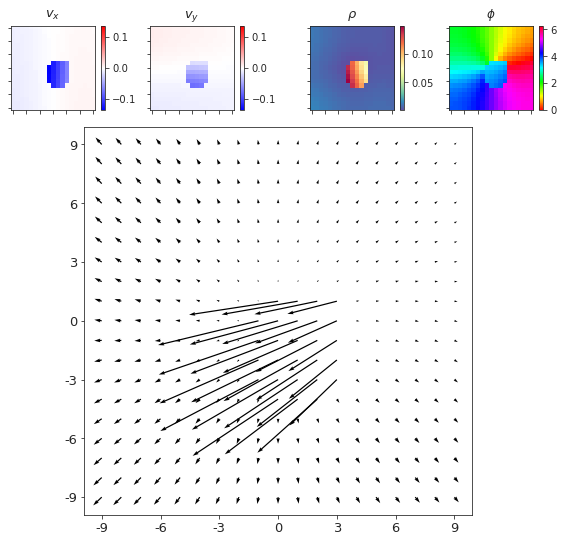

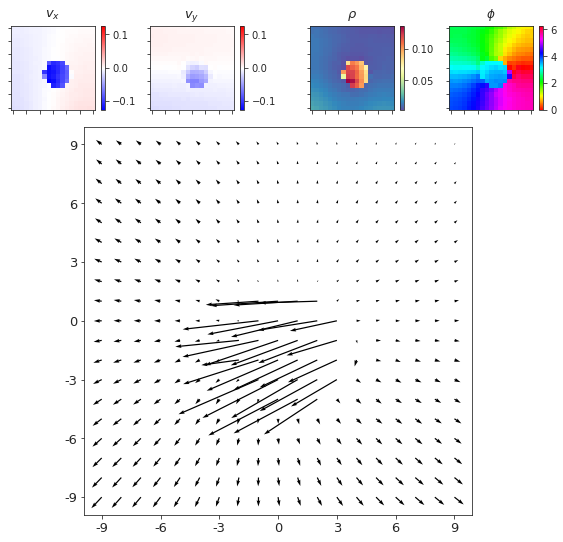

In [86]:
i = 204
show_opticflow_full(x[i])
show_opticflow_full(y[i]);

In [88]:
np.argmin(cos)

223

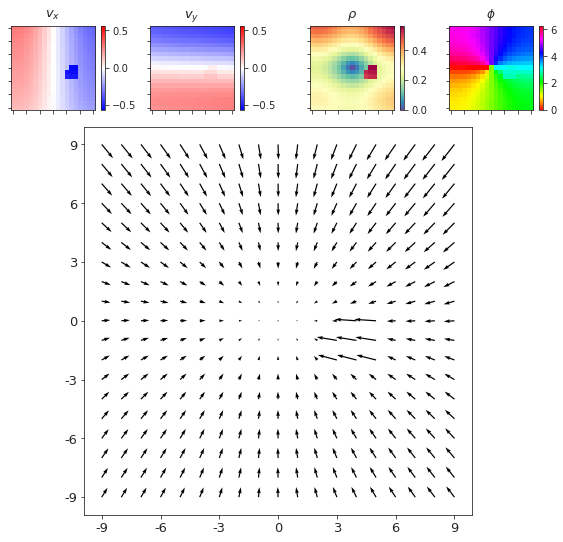

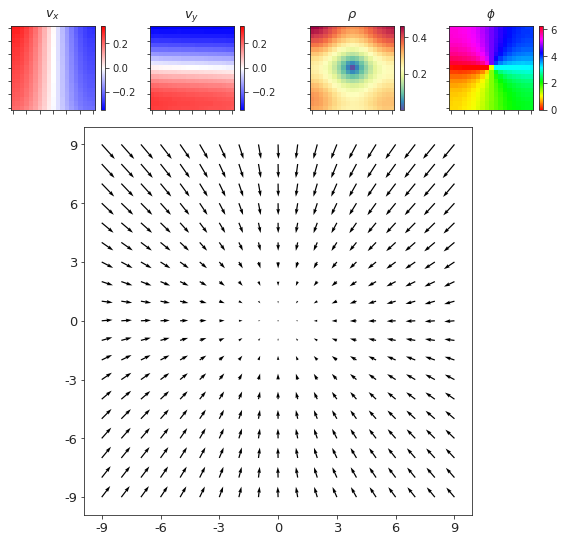

In [89]:
i = 223
show_opticflow_full(x[i])
show_opticflow_full(y[i]);

In [92]:
l1_bal[223], epe_bal[223]

(2.454739, 6.845421)

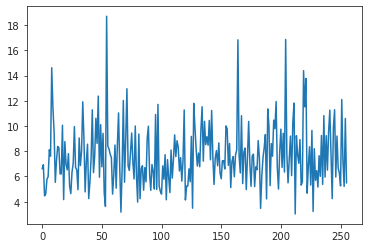

In [93]:
plt.plot(epe_bal)

In [94]:
w2p = {}
norms_expand = {}
for i, layer in enumerate(vae.expand):
    w2p[i] = to_np(layer.weight)
    _norm = to_np(torch.linalg.norm(layer.weight, dim=1).sum())
    norms_expand[i] = _norm
print({i: np.round(v, 3) for i, v in norms_expand.items()})

{0: 7.673, 1: 66.312, 2: 30.584, 3: 121.525, 4: 47.023, 5: 79.57, 6: 49.978}

In [97]:
_w.shape

(50, 50, 4, 4)

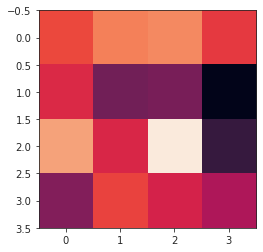

In [98]:
plt.imshow(_w[0,0 ])

In [ ]:
fig, axes = create_figure(num, num, (100, 60), 'all', 'all')
for z, k in itertools.product(range(num), range(num)):
    ax = axes[z, k]
    im = ax.imshow(_w[z, k])
    plt.colorbar(im, ax=ax)
    if z == 0:
        ax.set_title(f"k = {k}", fontsize=13)
    if k == 0:
        ax.set_ylabel(f"z = {z}", fontsize=13)
fig.suptitle(f'Expand_{i} (scale = {scales[i]})', fontsize=15, y=1.02)
plt.show()

KeyboardInterrupt: 

In [96]:
scales, _ = tr.model.latent_scales()
num = vae.cfg.n_latent_per_group

for i, _w in w2p.items():
    fig, axes = create_figure(num, num, (50, 30), 'all', 'all', tight_layout=True)
    for z, k in itertools.product(range(num), range(num)):
        ax = axes[z, k]
        im = ax.imshow(_w[z, k])
        plt.colorbar(im, ax=ax)
        if z == 0:
            ax.set_title(f"k = {k}", fontsize=13)
        if k == 0:
            ax.set_ylabel(f"z = {z}", fontsize=13)
    fig.suptitle(f'Expand_{i} (scale = {scales[i]})', fontsize=15, y=1.02)
    plt.show()

KeyboardInterrupt: 

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7f85aa37e8b0> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f85aa393940> (for post_execute):


KeyboardInterrupt: 

In [78]:
val['regr/mi'].shape

(11, 140)

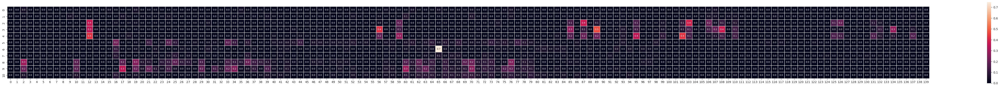

In [82]:
_ = show_heatmap(val['regr/mi'], vmin=0, vmax=None, cmap='rocket', figsize=(70, 5))

In [89]:
from sklearn.feature_selection import mutual_info_regression

In [92]:
z = val['z_vld'][:, 12]
g = val['g_vld']

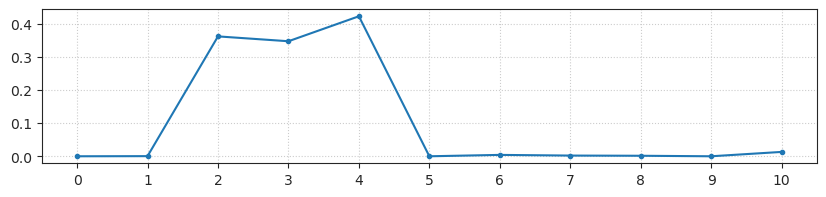

In [97]:
fig, ax = create_figure(figsize=(10, 2))
ax.plot(mutual_info_regression(g, z), marker='.')
ax.set_xticks(range(11))
ax.grid()

In [106]:
v_slf = g[:, 2:5]
v_slf = cart2polar(v_slf)
v_slf.shape

(7500, 3)

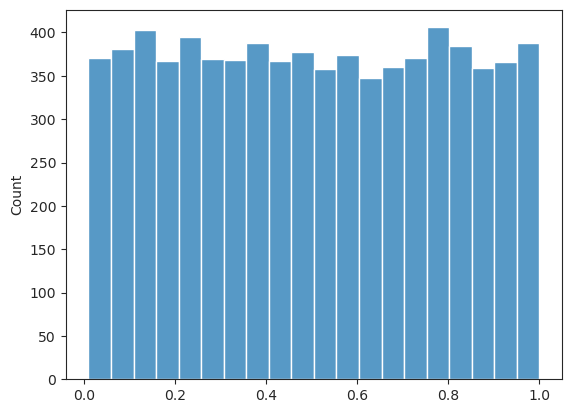

In [109]:
sns.histplot(v_slf[:, 0]);

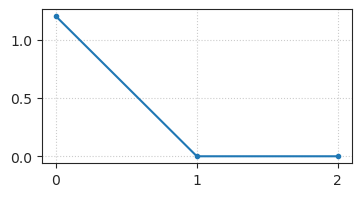

In [110]:
fig, ax = create_figure(figsize=(4, 2))
ax.plot(mutual_info_regression(v_slf, z), marker='.')
ax.set_xticks(range(3))
ax.grid()

In [111]:
vae.cfg.n_latent_per_group

20

In [8]:
from model.vae2d import *

In [11]:
norms = collections.defaultdict(list)
# norms['stem'] = list(to_np(vae.stem.log_weight_norm.exp()))
for cell in vae.enc_tower:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms[f"{type(cell).__name__}_enc"].extend(
                list(to_np(m.log_weight_norm.exp())))
for cell in vae.dec_tower:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms[f"{type(cell).__name__}_dec"].extend(
                list(to_np(m.log_weight_norm.exp())))
for cell in vae.enc_sampler:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms['enc_sampler'].extend(
                list(to_np(m.log_weight_norm.exp())))
for cell in vae.dec_sampler:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms['dec_sampler'].extend(
                list(to_np(m.log_weight_norm.exp())))
for cell in vae.expand:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms['expand'].extend(
                list(to_np(m.log_weight_norm.exp())))
for cell in vae.pre:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms[f"{type(cell).__name__}_pre"].extend(
                list(to_np(m.log_weight_norm.exp())))
for cell in vae.post:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms[f"{type(cell).__name__}_post"].extend(
                list(to_np(m.log_weight_norm.exp())))
norms = dict(sorted(norms.items()))

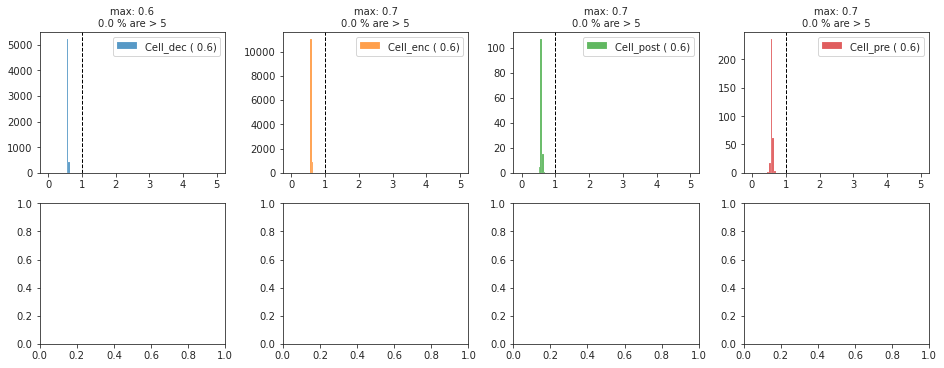

In [12]:
fig, axes = create_figure(2, 4, (13, 5), constrained_layout=True)
for i, (k, v) in enumerate(norms.items()):
    ax = axes.flat[i]
    ax.axvline(1, color='k', ls='--', lw=1.0, zorder=0)
    sns.histplot(v, color=f"C{i}", bins=np.linspace(0, 5, 101), label=f"{k} ({np.mean(v): 0.1f})", ax=ax)
    title = f"max: {np.max(v):0.1f}\n{100 * (np.array(v) > 5).sum() / len(v):0.1f} % are > 5"
    ax.set_title(title, fontsize=10)
    ax.set_ylabel('')
    ax.legend()
plt.show()

In [20]:
i = 0
for cell in vae.modules():
    if isinstance(cell, Cell):
        for m in cell.modules():
            i += 1
i

678

In [21]:
i = 0
for lay in vae.modules():
    if isinstance(lay, (Conv2D, DeConv2D)):
        i += 1

In [56]:
i

87

In [57]:
vae.modules()

<generator object Module.modules at 0x7f2b4176b4a0>

In [59]:
next(vae.named_children())

('stem',
 ParametrizedConv2D(
   2, 32, kernel_size=(4, 4), stride=(1, 1), padding=valid
   (parametrizations): ModuleDict(
     (weight): ParametrizationList(
       (0): _SpectralNorm()
     )
   )
 ))

In [15]:
tr.cfg.beta = 1.0
beta = 0.9

In [16]:
self = tr

In [17]:
x, norm = next(iter(tr.dl_tst))
x, norm = tr.to([x, norm])

In [19]:
tr.model.eval;
with torch.no_grad():
    y, _, q_all, p_all = self.model(x)
kl_all, kl_diag = self.model.loss_kl(q_all, p_all)

In [21]:
def kl_balancer(kl_all, alpha=None, coeff=1.0, beta=1.0):
	if alpha is not None and coeff < beta:
		alpha = alpha.unsqueeze(0)

		kl_all = torch.stack(kl_all, dim=1)
		kl_coeff_i, kl_vals = kl_per_group(kl_all)
		total_kl = torch.sum(kl_coeff_i)

		kl_coeff_i = kl_coeff_i / alpha * total_kl
		kl_coeff_i = kl_coeff_i / torch.mean(
			kl_coeff_i, dim=1, keepdim=True)
		kl = torch.sum(kl_all * kl_coeff_i.detach(), dim=1)

		# for reporting
		kl_coeffs = kl_coeff_i.squeeze(0)
	else:
		kl_all = torch.stack(kl_all, dim=1)
		kl_vals = torch.mean(kl_all, dim=0)
		kl = torch.sum(kl_all, dim=1)
		kl_coeffs = torch.ones(size=(len(kl_vals),))

	return coeff * kl, kl_coeffs, kl_vals

In [41]:
balanced_kl, kl_coeffs, kl_vals = kl_balancer(
    coeff=0.5,
    kl_all=kl_all,
    alpha=self.alpha,
    beta=10,
)

In [42]:
kl_vals

tensor([2.0650, 4.7259, 3.4965, 5.4857, 3.0087, 1.8146, 2.6250],
       device='cuda:1')

In [43]:
kl_coeffs

tensor([0.6236, 1.4233, 1.0538, 1.6517, 0.9073, 0.5484, 0.7919],
       device='cuda:1')

In [64]:
len(all_conv_layers)

87

In [66]:
self = vae

(87, 87)

In [72]:
apply_norm = None
apply_norm = apply_norm if apply_norm else [
    'enc_tower', 'dec_tower']
self.all_log_norm = []
self.all_conv_layers = []
for child_name, child in self.named_children():
    for m in child.modules():
        if isinstance(m, (Conv2D, DeConv2D)):
            self.all_conv_layers.append(m)
            if child_name in apply_norm:
                self.all_log_norm.append(
                    m.log_weight_norm)

In [73]:
len(self.all_log_norm), len(all_conv_layers)

(69, 87)

In [27]:
tr.cfg.kl_anneal_portion, tr.cfg.kl_const_portion

(0.3, 0.0001)

In [41]:
tr.cfg.kl_const_portion = 0.4

In [42]:
epochs = range(1000)
n_total_iter = len(epochs) * len(tr.dl_trn)

coeffs = np.zeros(n_total_iter)
for gstep in range(n_total_iter):
    beta = kl_coeff(
        step=gstep,
        total_step=tr.cfg.kl_anneal_portion * n_total_iter,
        constant_step=tr.cfg.kl_const_portion * n_total_iter,
        min_kl_coeff=tr.cfg.kl_const_coeff,
    )
    coeffs[gstep] = beta

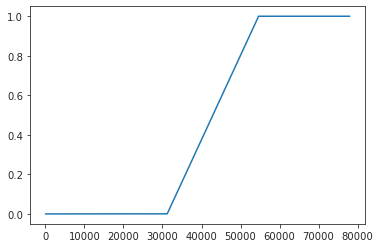

In [43]:
plt.plot(coeffs)

In [19]:
x, norm = next(iter(tr.dl_tst))
x, norm = tr.to([x, norm])

In [20]:
with torch.no_grad():
    y, z, _, _, kl_all, _ = tr.model(x)

In [22]:
err = endpoint_error(
    true=x,
    pred=y,
    w=None,
)
err_balanced = endpoint_error(
    true=x,
    pred=y,
    w=1/norm,
)

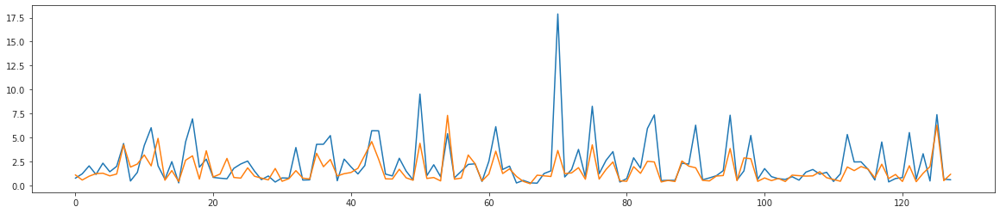

In [23]:
fig, ax = create_figure(1, 1, (20, 4))
ax.plot(to_np(err))
ax.plot(to_np(err_balanced))

In [24]:
ids = np.argsort(to_np(err))[::-1][:16]
ids

array([ 70,  50,  75, 125,  84,  95,  17,  90,  61,  11,  83,  43,  44,
       121,  54, 112])

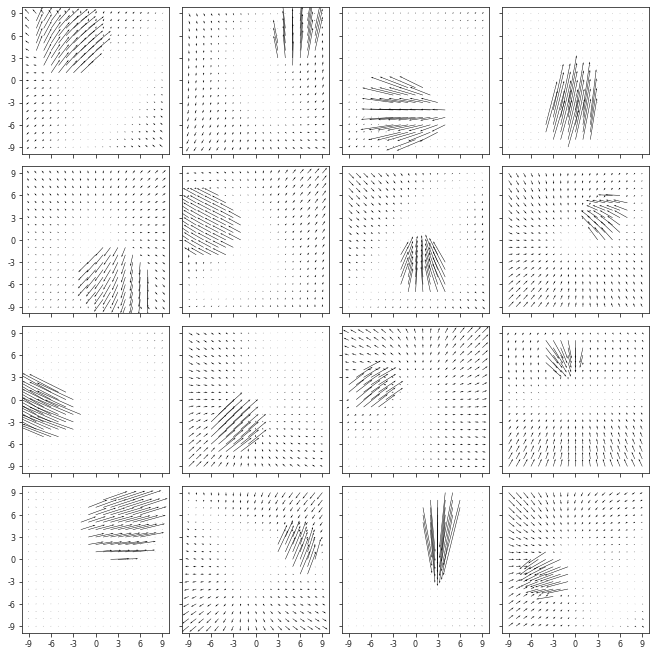

In [25]:
show_opticflow(to_np(x)[ids]);

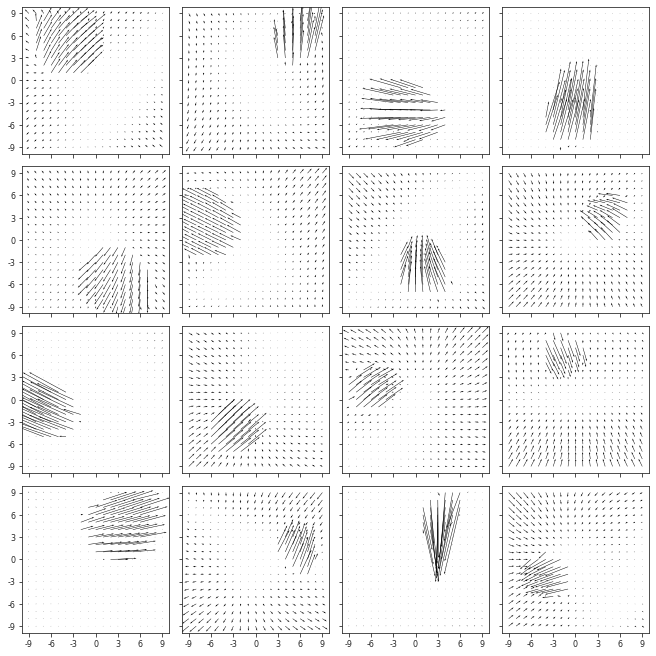

In [26]:
show_opticflow(to_np(y)[ids]);

In [27]:
to_np(norm)[ids].mean(), to_np(norm)[ids].std()

(131.92853, 54.550587)

In [28]:
ids = np.argsort(to_np(err_balanced))[::-1][:16]
ids

array([ 54, 125,  12,  43,  50,   7,  75,  95,  70,  19,  61,  35,  10,
        57,  42,  17])

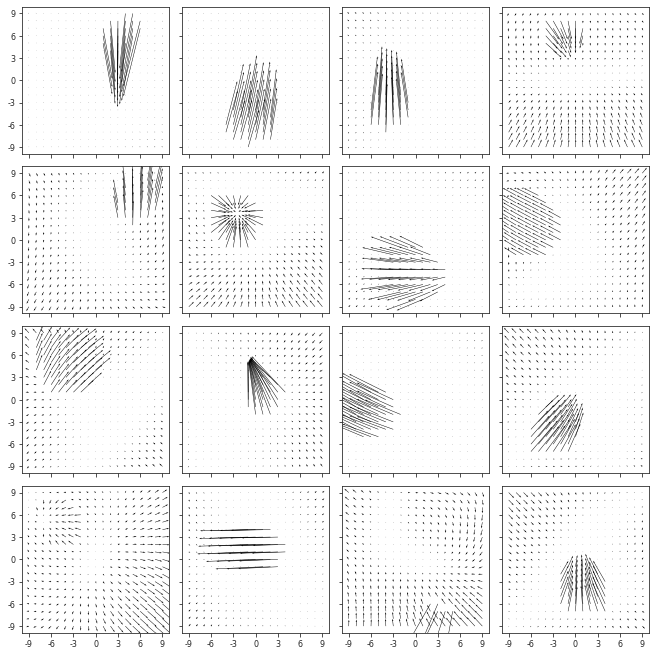

In [29]:
show_opticflow(to_np(x)[ids]);

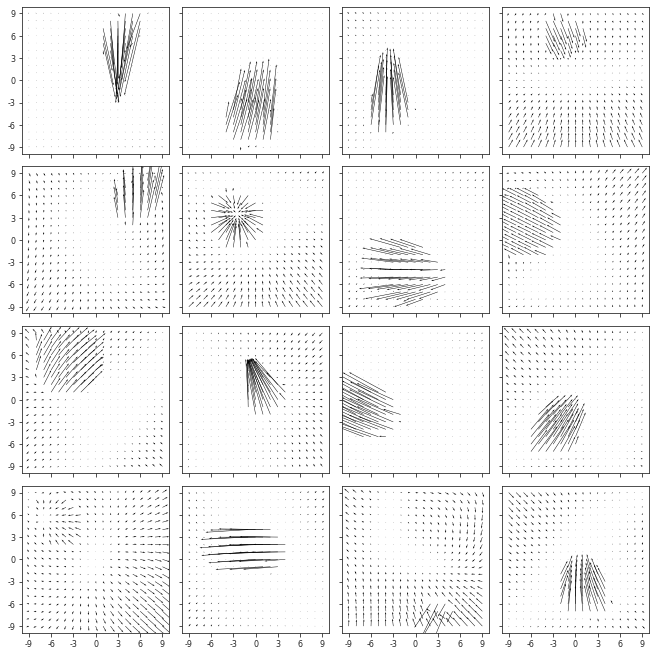

In [30]:
show_opticflow(to_np(y)[ids]);

In [31]:
to_np(norm)[ids]

array([ 41.65228 ,  66.227554,  23.419271,  70.42371 , 122.443756,
        58.194283, 110.26061 , 107.50057 , 277.6194  ,  42.64491 ,
        96.87961 ,  72.19697 ,  73.896515,  38.897198,  37.01743 ,
       127.250305], dtype=float32)

In [32]:
to_np(norm)[ids].mean(), to_np(norm)[ids].std()

(85.407776, 58.64926)

In [33]:
list(val)

['x_sample',
 'z_sample',
 'z_vld',
 'z_tst',
 'g_vld',
 'g_tst',
 'regr/mi',
 'regr/r',
 'regr/lr',
 'fig/sample',
 'fig/corr_z',
 'fig/regression',
 'fig/mutual_info',
 'fig/hist_z',
 'fig/hist_x_sample']

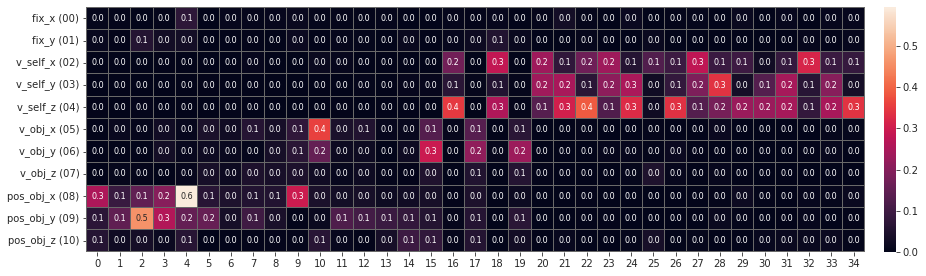

In [35]:
val['fig/mutual_info']

In [37]:
data, loss = forward(tr, 'tst')

In [38]:
{k: v.mean() for k, v in loss.items()}

{'kl': 91.2339, 'recon': 2.0290143, 'recon_balanced': 1.3277894}

In [39]:
{k: v.shape for k, v in loss.items()}

{'kl': (2500,), 'recon': (2500,), 'recon_balanced': (2500,)}

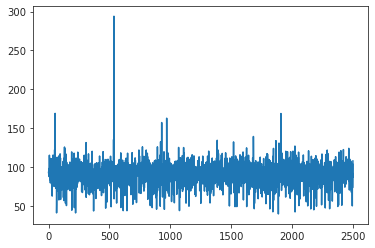

In [40]:
plt.plot(loss['kl'])

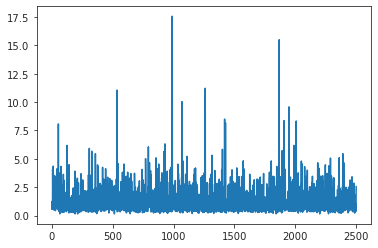

In [41]:
plt.plot(loss['recon_balanced'])

In [42]:
worst = np.argsort(loss['recon_balanced'])[::-1]

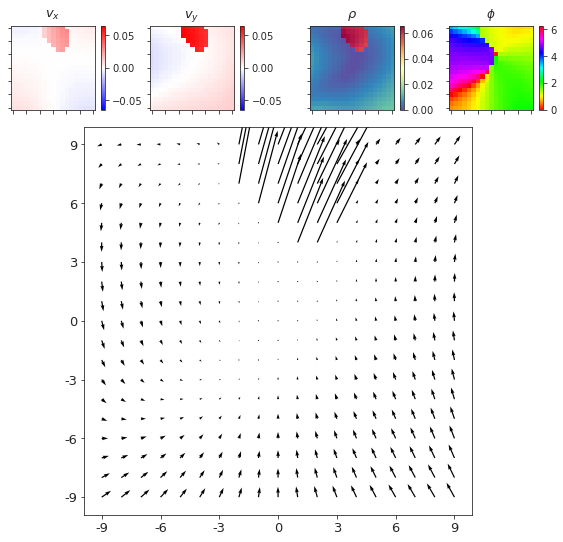

In [43]:
show_opticflow_full(data['x'][worst[2]]);

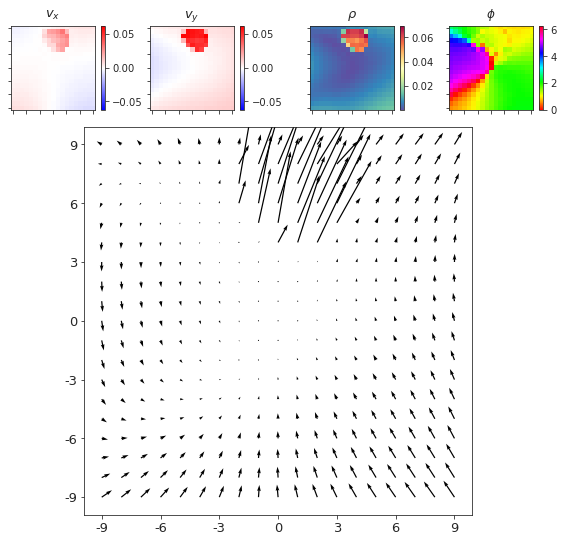

In [44]:
show_opticflow_full(data['y'][worst[2]]);

In [45]:
worst_kl = np.argsort(loss['kl'])[::-1]

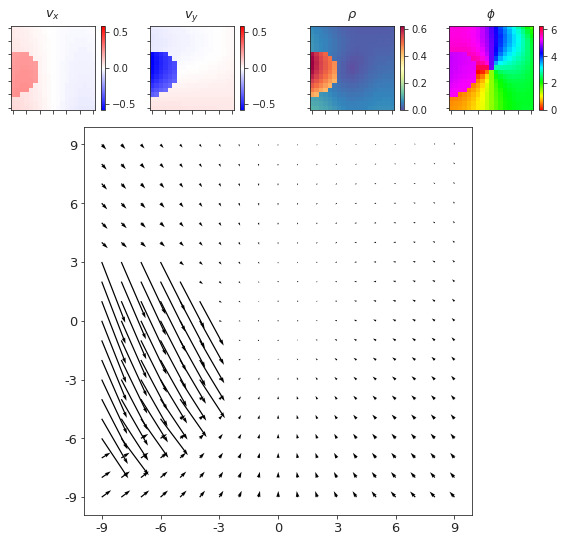

In [46]:
show_opticflow_full(data['x'][worst_kl[0]]);

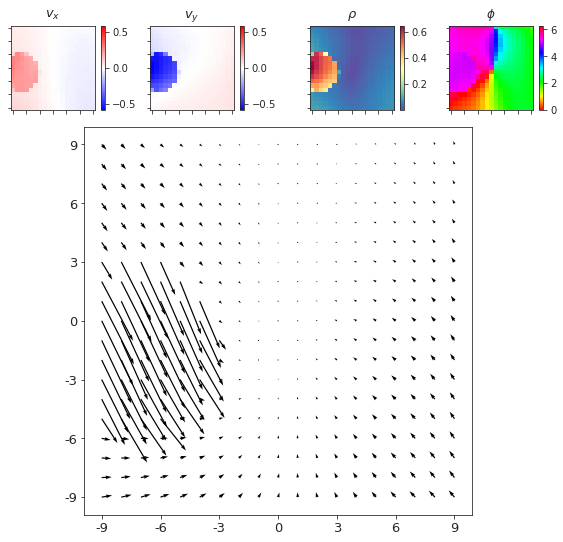

In [47]:
show_opticflow_full(data['y'][worst_kl[0]]);

In [48]:
sp_stats.pearsonr(loss['recon_balanced'], loss['kl'])

(0.6837016724074185, 0.0)

In [49]:
sp_stats.pearsonr(loss['recon'], loss['kl'])

(0.5539106515657071, 4.76752002755197e-201)

In [50]:
sp_stats.pearsonr(loss['recon_balanced'], loss['recon'])

(0.5525529432454842, 7.138997974281768e-200)

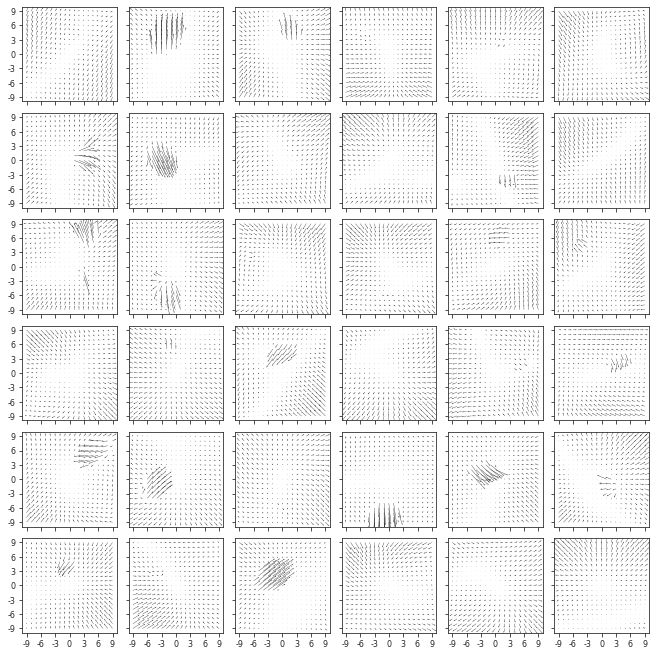

In [52]:
_ = show_opticflow(val['x_sample'], 6)

In [53]:
list(val)

['x_sample',
 'z_sample',
 'z_vld',
 'z_tst',
 'g_vld',
 'g_tst',
 'regr/mi',
 'regr/r',
 'regr/lr',
 'fig/sample',
 'fig/corr_z',
 'fig/regression',
 'fig/mutual_info',
 'fig/hist_z',
 'fig/hist_x_sample']

fig/sample

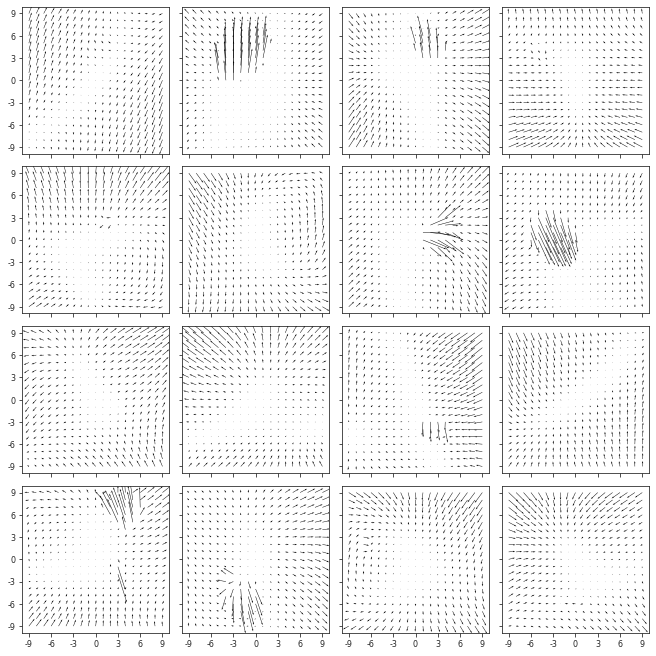

fig/corr_z

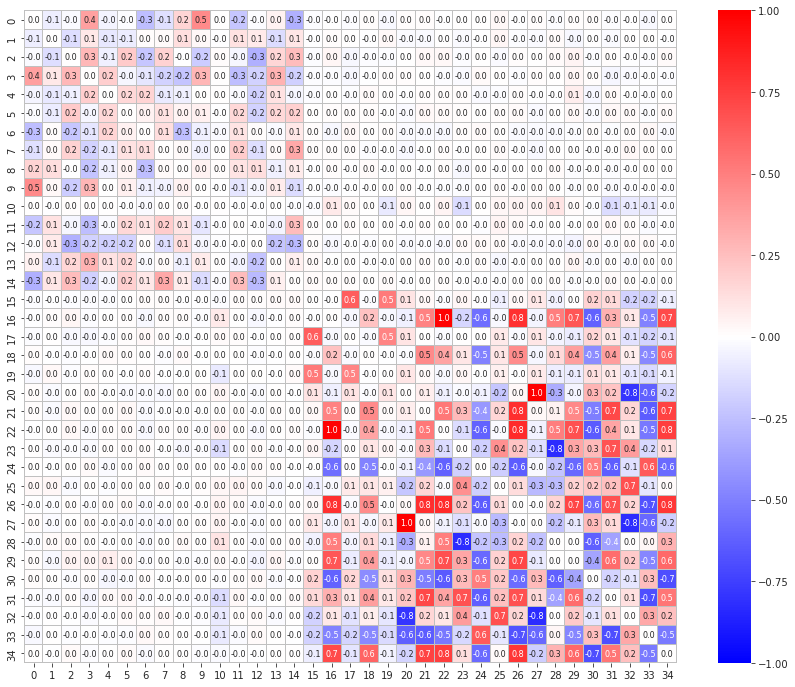

fig/regression

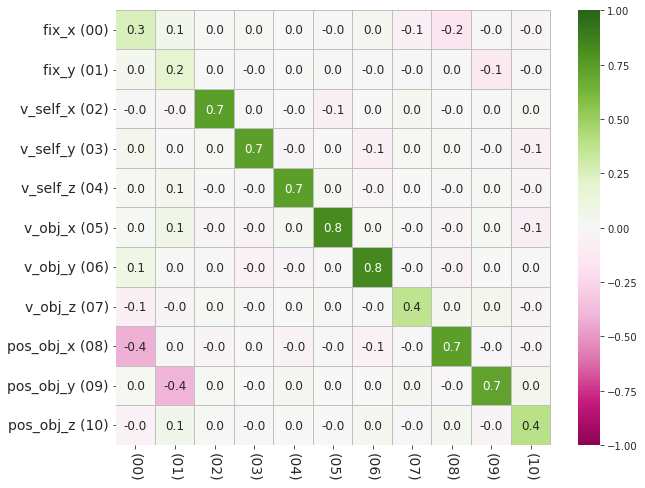

fig/mutual_info

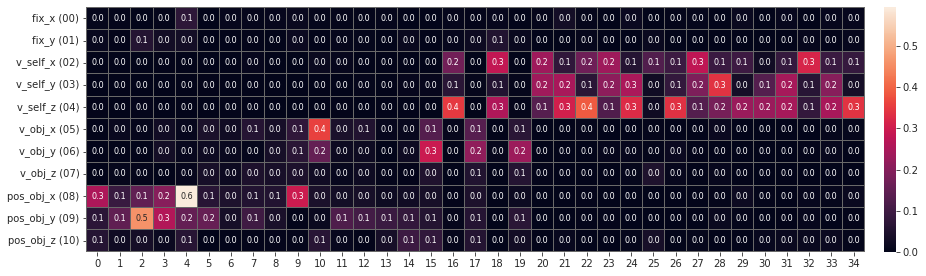

fig/hist_z

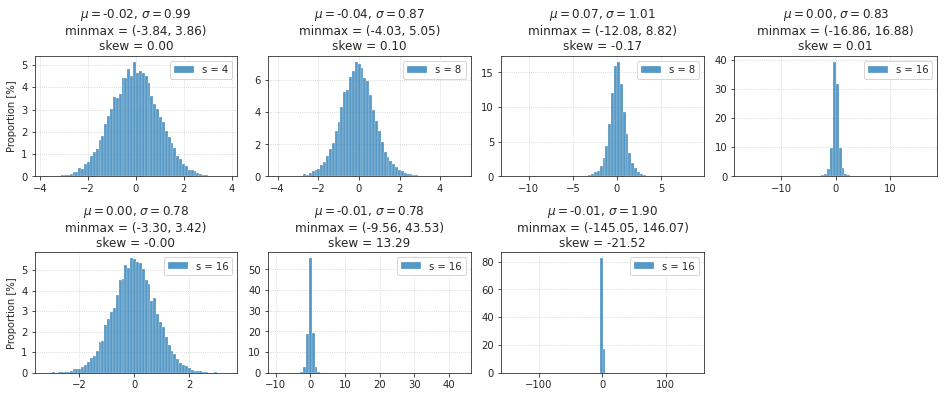

fig/hist_x_sample

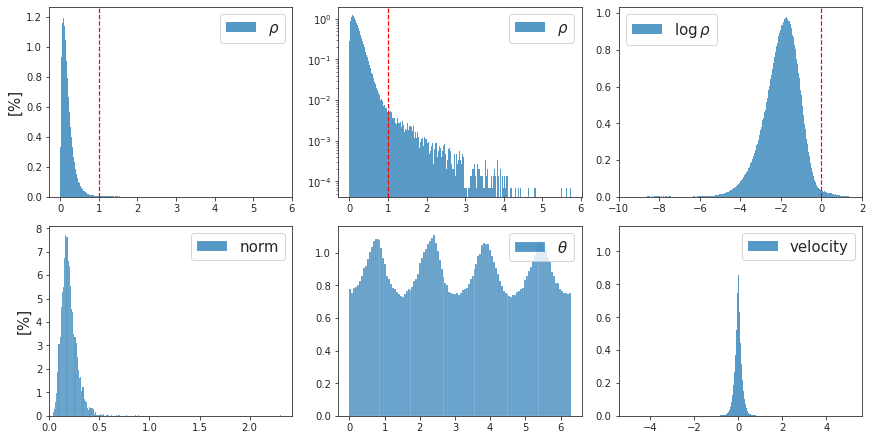

In [56]:
for k, v in val.items():
    if 'fig' in k:
        print(k)
        display(v)

In [25]:
to_np(torch.linalg.vector_norm(vae.stem.weight, dim=[1, 2, 3]))

array([0.12810904, 0.21889564, 0.21213646, 0.23898908, 0.26464158,
       0.22333531, 0.14764893, 0.22803165, 0.19473101, 0.14975601,
       0.28858453, 0.28247535, 0.234966  , 0.14203611, 0.25449663,
       0.2774155 , 0.14323731, 0.24444684, 0.21794473, 0.21319197,
       0.14051361, 0.31486693, 0.22484505, 0.09385117, 0.19239986,
       0.15647613, 0.1816894 , 0.27404597, 0.16939262, 0.3176312 ,
       0.24297562, 0.13734569, 0.20481722, 0.27996248, 0.36396262,
       0.10510738, 0.21351688, 0.35216305, 0.12966399, 0.12744176,
       0.13831973, 0.18600093, 0.12826237, 0.11905325, 0.19547994,
       0.15562478, 0.27106288, 0.20461586, 0.6398145 , 0.17176522,
       0.26067924, 0.21045041, 0.1722161 , 0.23007245, 0.1166497 ,
       0.25988105, 0.24044141, 0.24709582, 0.36232522, 0.1462865 ,
       0.25419515, 0.17688769, 0.13448782, 0.15440232], dtype=float32)

In [26]:
w = to_np(vae.stem.weight)
w.shape

(64, 2, 4, 4)

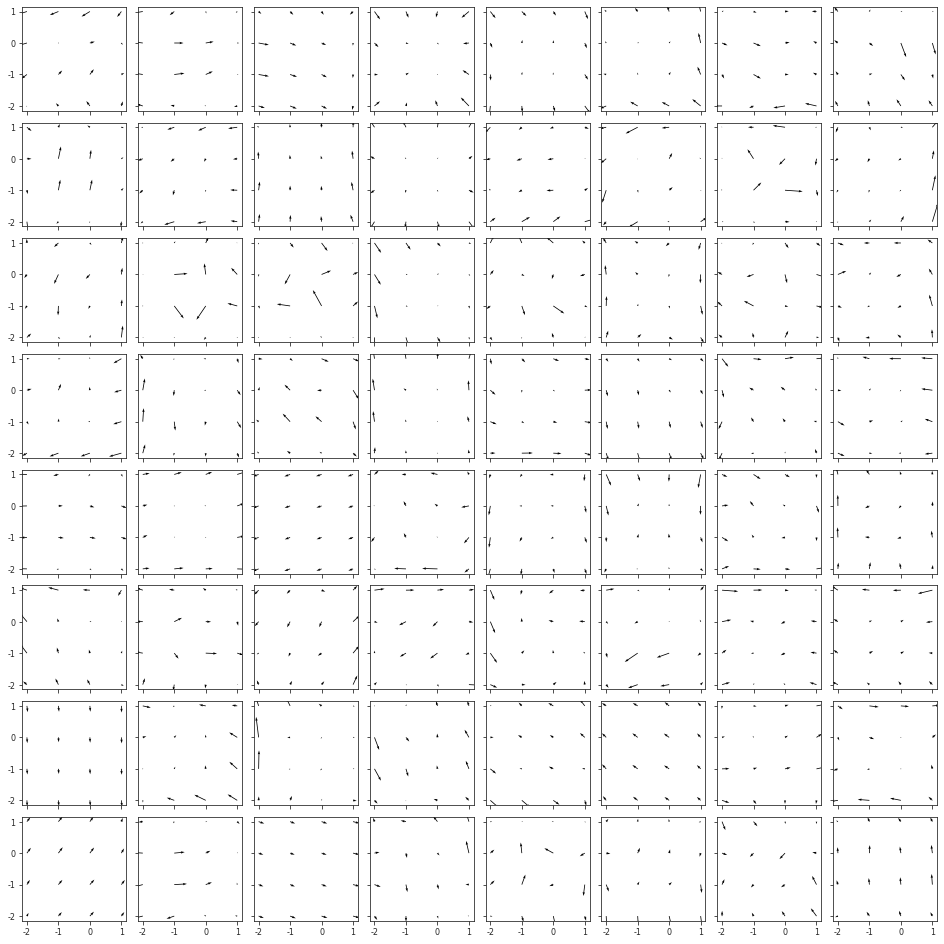

In [27]:
_ = show_opticflow(w, 8, figsize=(13,) * 2, tick_spacing=1)

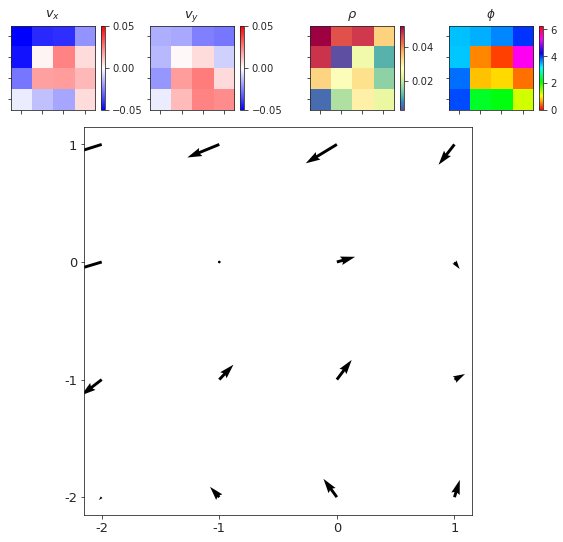

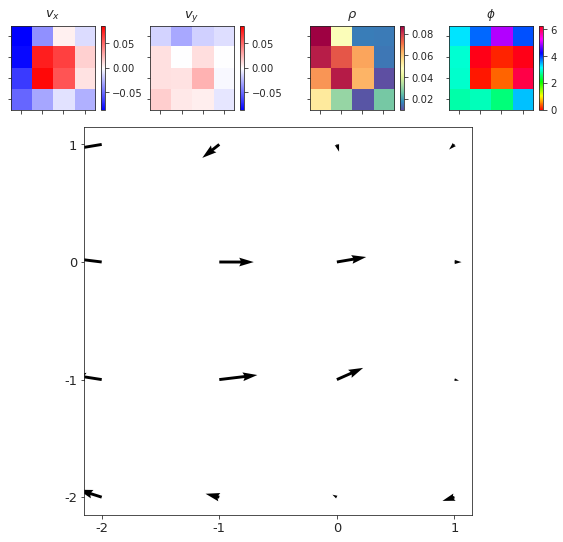

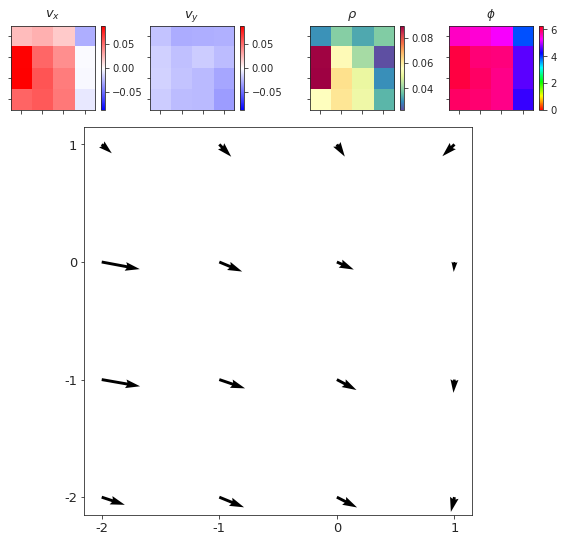

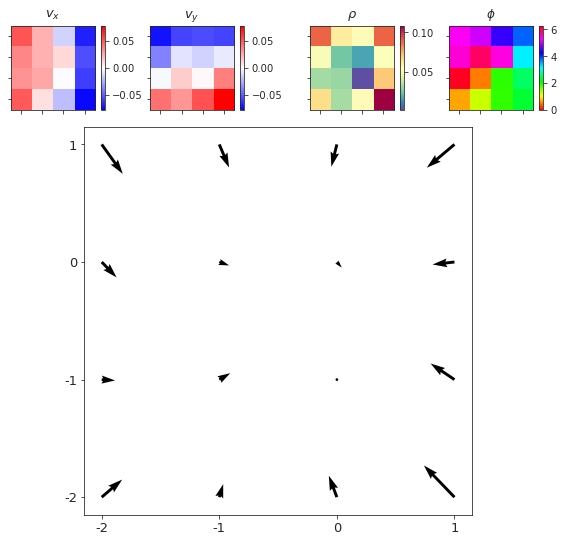

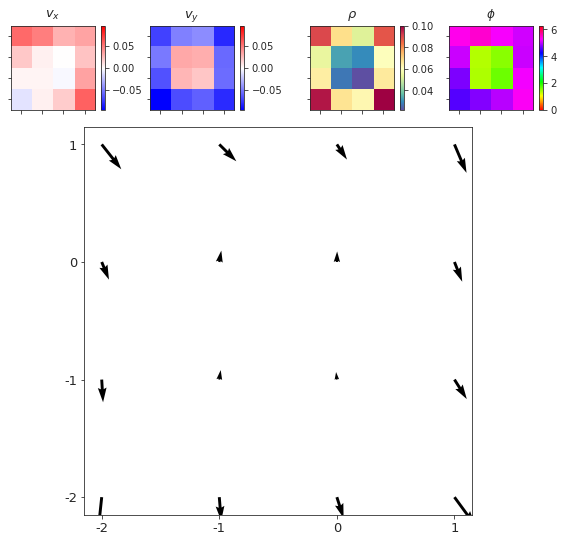

...

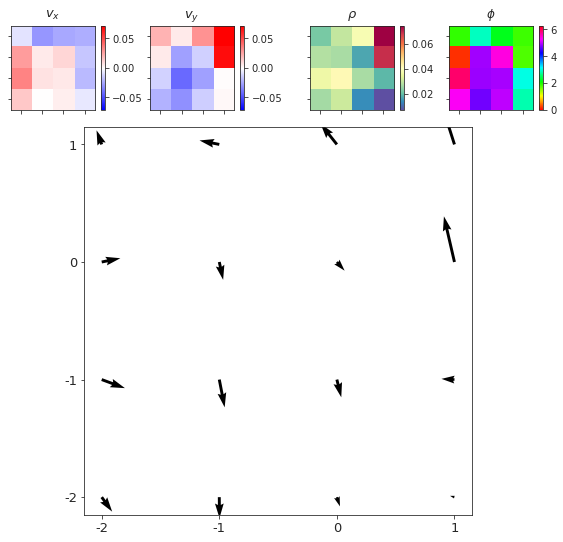

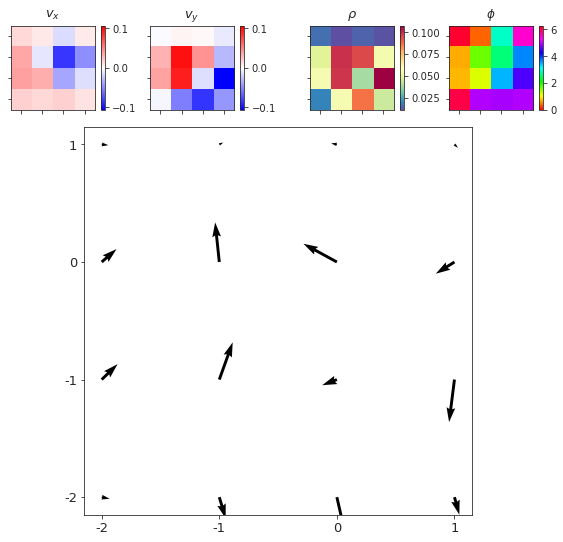

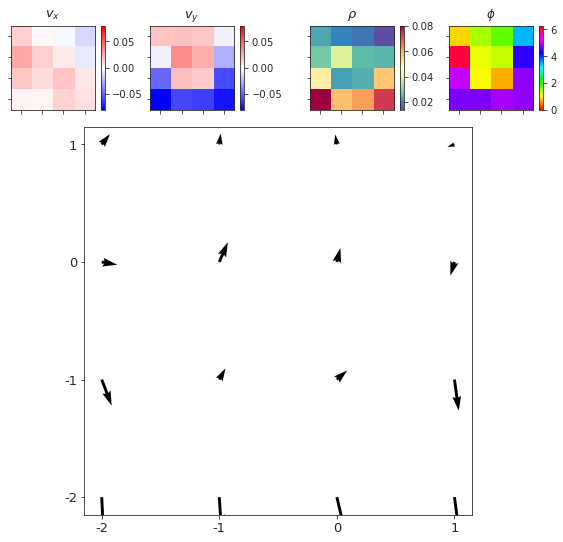

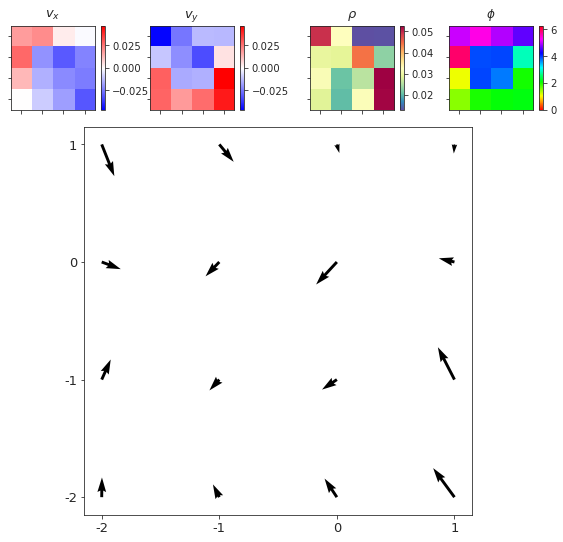

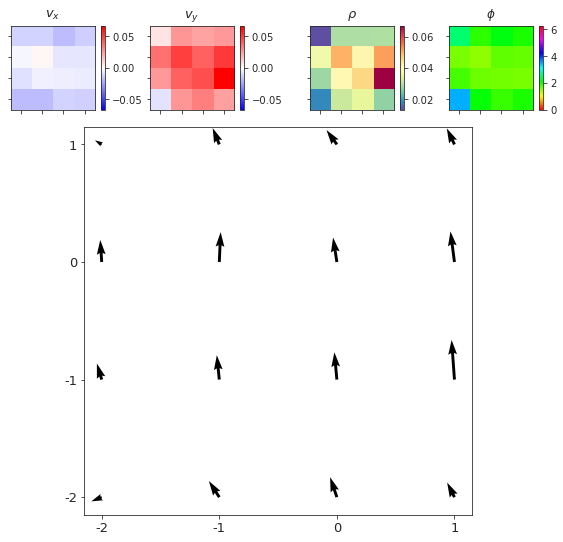

In [28]:
for k in range(64):
    _ = show_opticflow_full(w[k], tick_spacing=1)

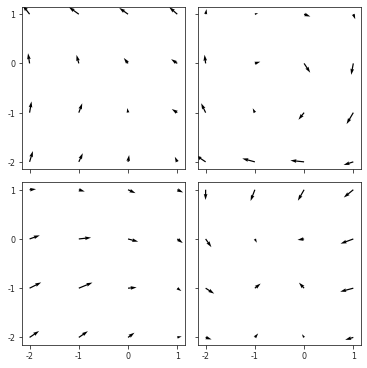

In [92]:
# Was with Linear sampler + expand

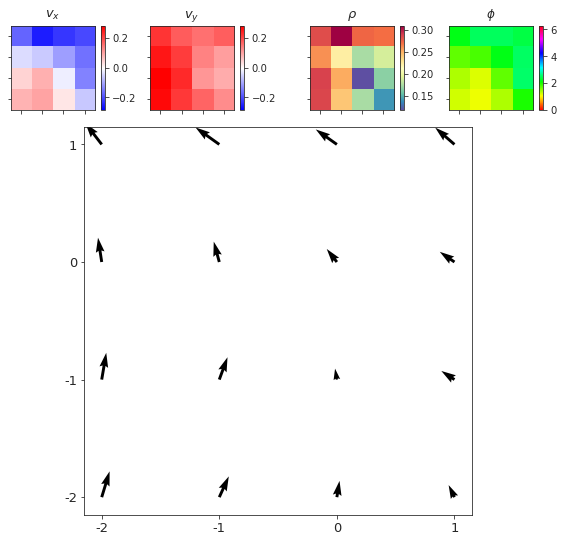

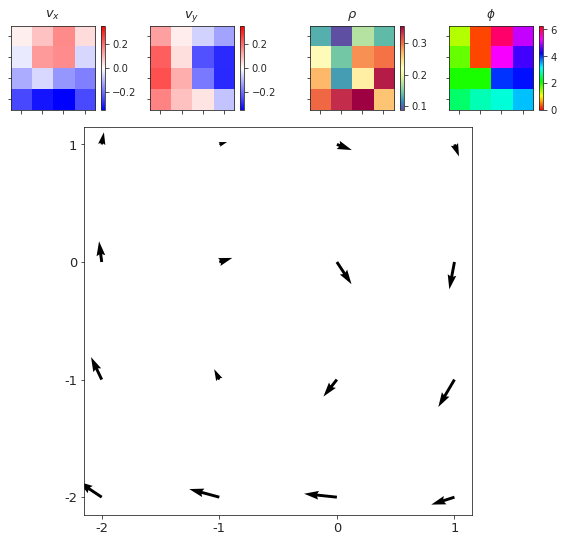

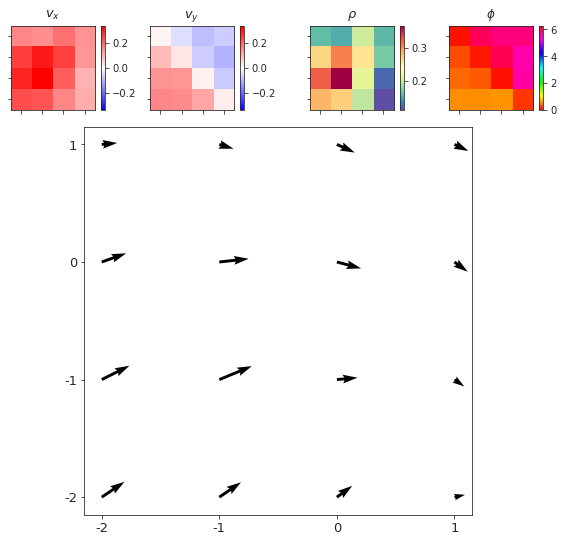

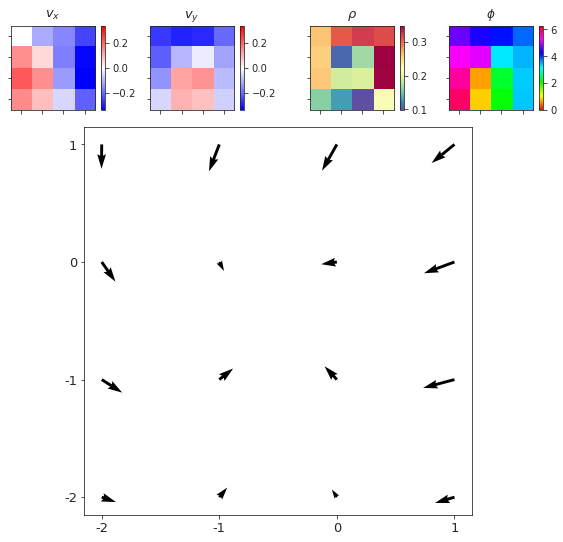

In [93]:
# Was with Linear sampler + expand

In [29]:
w2p = {}
norms_expand = {}
for i, layer in enumerate(vae.expand):
    w2p[i] = to_np(layer.weight)
    _norm = to_np(layer.log_weight_norm.exp())
    norms_expand[i] = list(_norm)

In [30]:
print({i: np.round(v, 3) for i, v in norms_expand.items()})

{
    0: array([8.186], dtype=float32),
    1: array([10.674], dtype=float32),
    2: array([15.024], dtype=float32),
    3: array([124.413], dtype=float32),
    4: array([365.485], dtype=float32),
    5: array([146.037], dtype=float32),
    6: array([98.435], dtype=float32)
}

In [31]:
scales = vae.latent_scales()

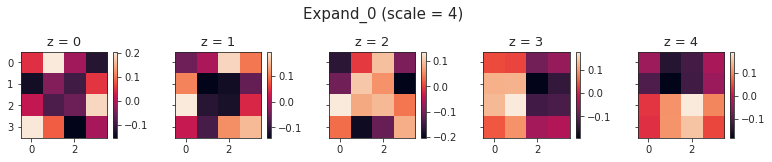

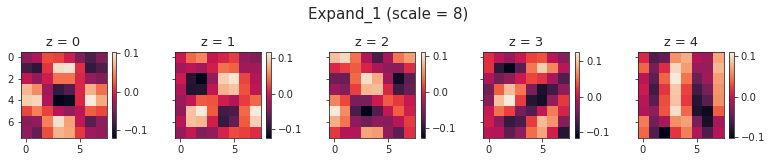

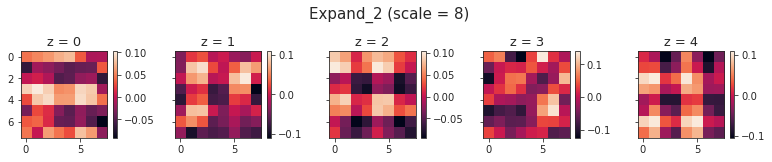

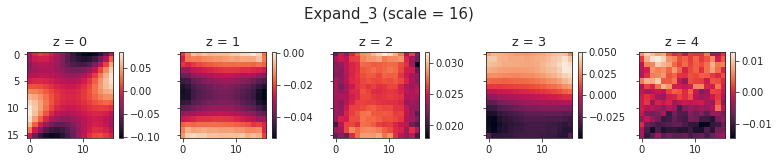

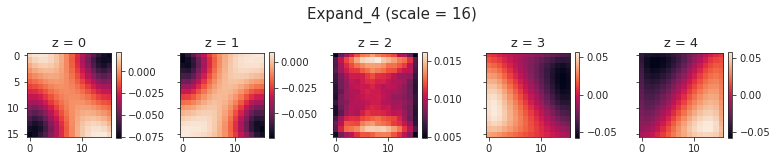

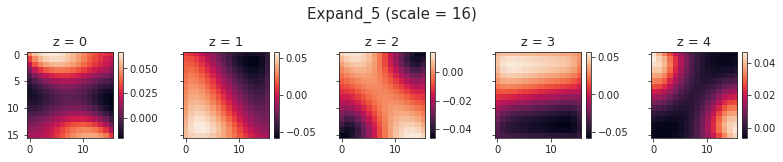

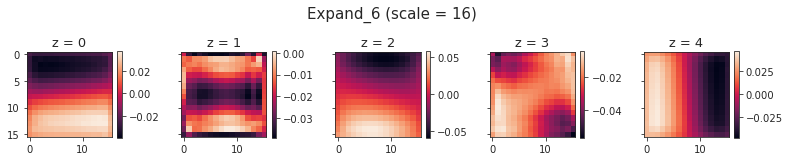

In [33]:
for i, _w in w2p.items():
    num = tr.model.cfg.n_latent_per_group
    fig, axes = create_figure(1, num, (11, 2.0), 'all', 'all', tight_layout=True)
    for z in range(num):
        ax = axes.flat[z]
        im = ax.imshow(_w[z, 0])
        plt.colorbar(im, ax=ax)
        ax.set_title(f'z = {z}', fontsize=13)
    fig.suptitle(f'Expand_{i} (scale = {scales[i]})', fontsize=15, y=1.02)
    plt.show()

In [34]:
x_sample, z_sample = val['x_sample'], val['z_sample']

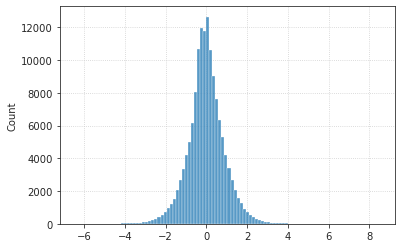

In [35]:
ax = sns.histplot(z_sample.ravel(), bins=100)
ax.grid()

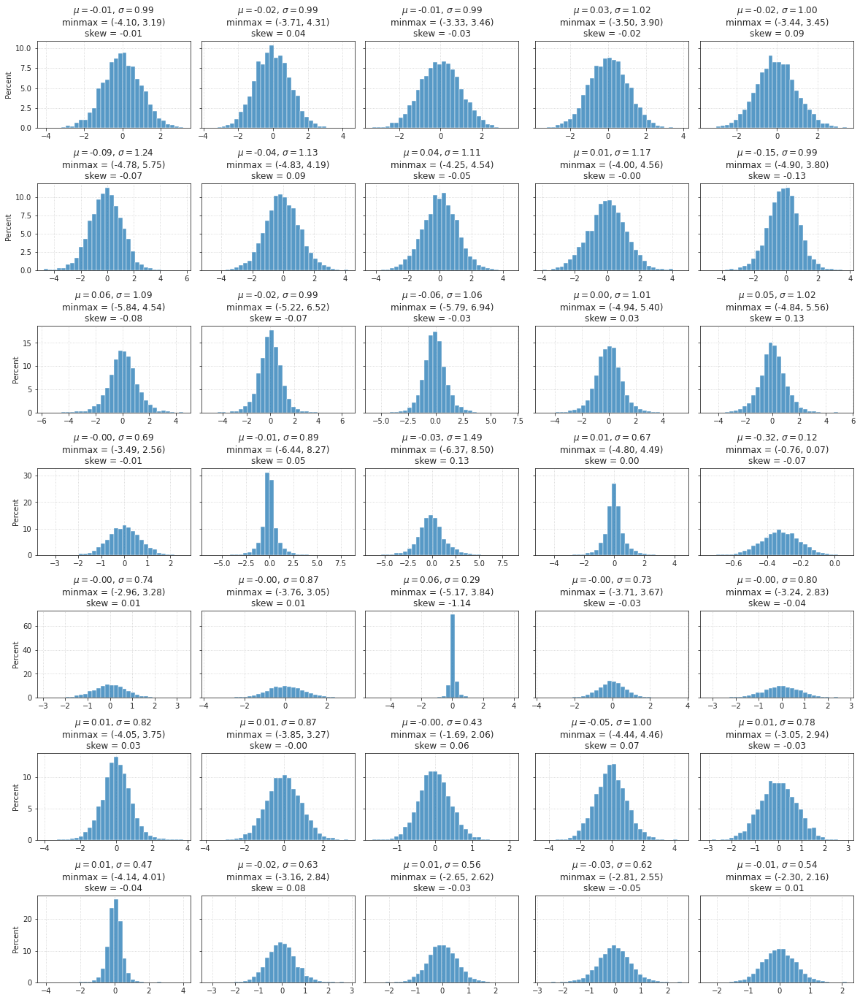

In [38]:
_ = plot_latents_hist_full(z_sample, scales)

In [39]:
rho, theta = vel2polar(np.transpose(x_sample, (0, 2, 3, 1)))
rho.shape

(4096, 19, 19)

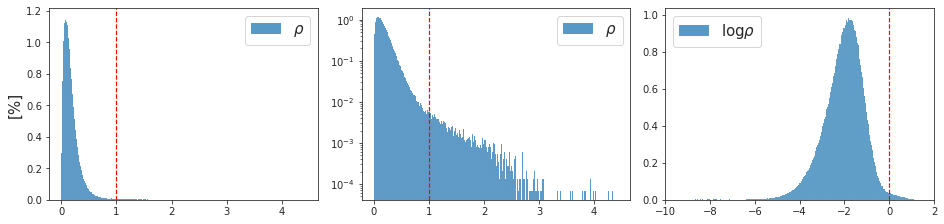

In [40]:
fig, axes = create_figure(1, 3, (13, 3), constrained_layout=True)
sns.histplot(rho.ravel(), stat='percent', label=r'$\rho$', ax=axes[0])
sns.histplot(rho.ravel(), stat='percent', label=r'$\rho$', ax=axes[1])
sns.histplot(np.log(rho[rho.nonzero()]), label=r'$\log \rho$', stat='percent', ax=axes[2])

for ax in axes.flat:
    ax.set_ylabel('')
    ax.legend(fontsize=15)
for ax in axes[:2].flat:
    ax.axvline(1, color='r', ls='--', lw=1.2)

axes[0].set_ylabel('[%]', fontsize=15)
axes[1].set_yscale('log')
axes[2].set_xlim(-10, 2)
axes[2].axvline(0, color='r', ls='--', lw=1.2)

plt.show()

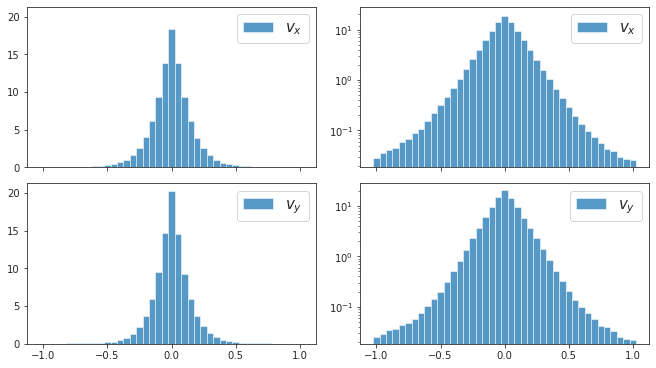

In [41]:
n = 40
bins = np.linspace(-1, 1 + 2 / n, n + 2) - 1 / n

fig, axes = create_figure(2, 2, figsize=(9, 5), sharex='all', sharey='col', constrained_layout=True)
for i in range(2):
    lbl = r'$v_x$' if i == 0 else r'$v_y$'
    sns.histplot(x_sample[:, i, ...].ravel(), label=lbl, bins=bins, stat='percent', ax=axes[i, 0])
    sns.histplot(x_sample[:, i, ...].ravel(), label=lbl, bins=bins, stat='percent', ax=axes[i, 1])
    axes[i, 1].set_yscale('log')
for ax in axes.flat:
    ax.set_ylabel('')
    ax.legend(fontsize=15)
plt.show()

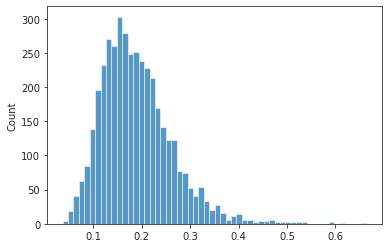

In [42]:
norm = rho.mean(1).mean(1)
sns.histplot(norm);

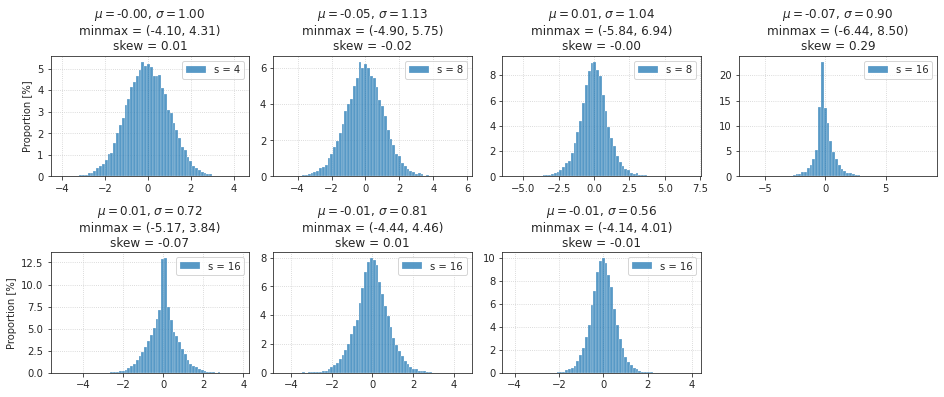

In [43]:
plot_latents_hist(z_sample, scales);

In [44]:
i, z_idx = np.unravel_index(np.argmax(z_sample), z_sample.shape)
i, z_idx

(51, 17)

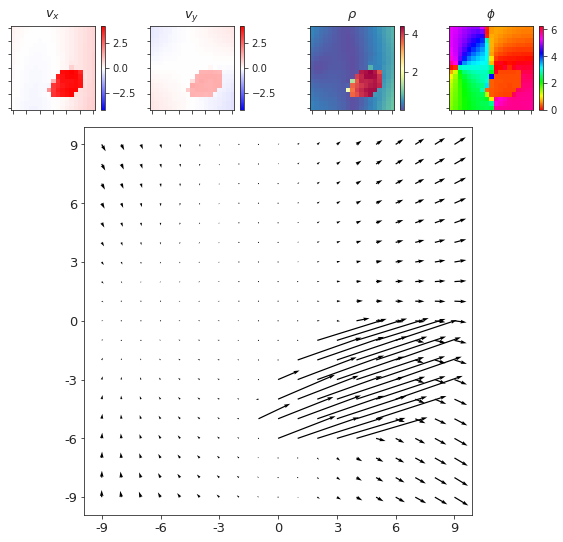

In [45]:
show_opticflow_full(x_sample[i]);

In [46]:
i, z_idx = np.unravel_index(np.argmin(z_sample), z_sample.shape)
i, z_idx

(3438, 16)

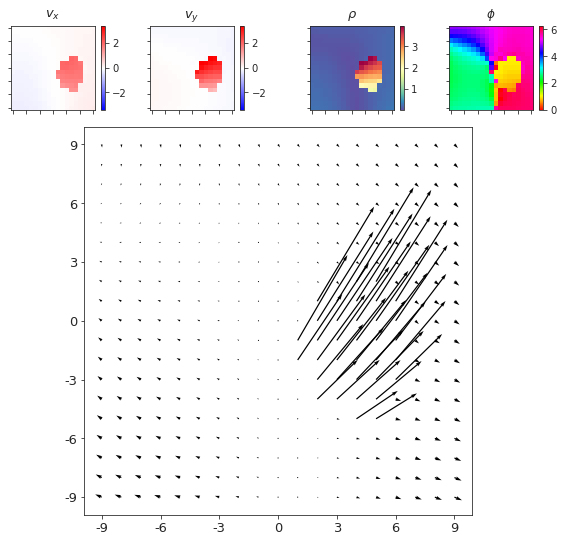

In [47]:
show_opticflow_full(x_sample[i]);

In [48]:
ticks = [
    i for i in range(tr.model.cfg.total_latents())
    if i % tr.model.cfg.n_latent_per_group == 0
]
ticklabels = [i + 1 for i in ticks]

In [49]:
val['z'].shape

(7500, 35)

In [50]:
u, s, v = sp_lin.svd(val['z'], full_matrices=False, compute_uv=True)
s *= 100 / s.sum()
u.shape, s.shape, v.shape

((7500, 35), (35,), (35, 35))

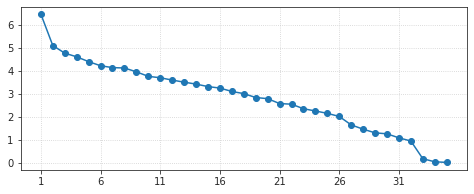

In [51]:
fig, ax = create_figure(figsize=(8, 3))
ax.plot(s, marker='o')
ax.set(xticks=ticks, xticklabels=ticklabels)
ax.grid()

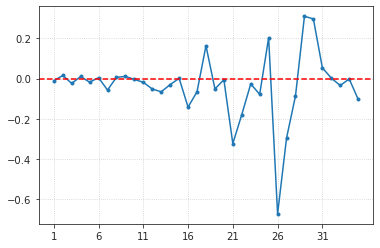

In [52]:
fig, ax = create_figure()
ax.plot(v[2], marker='.')
ax.axhline(0, color='r', ls='--')
ax.set(xticks=ticks, xticklabels=ticklabels)
ax.grid()
plt.show()

In [53]:
r = 1 - sp_dist.pdist(val['z'].T, 'correlation')
r = sp_dist.squareform(r)

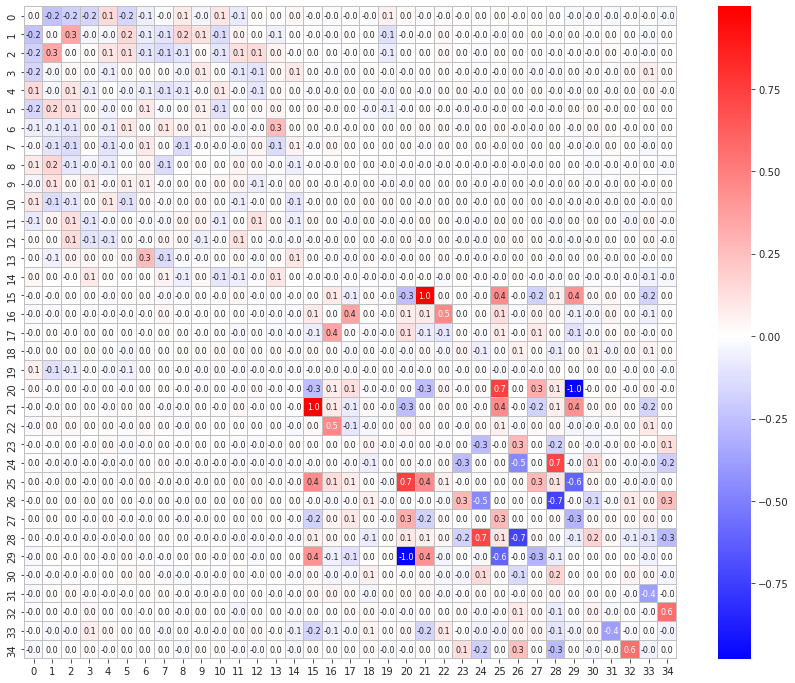

In [54]:
fig, ax = create_figure(1, 1, (15, 12))
sns.heatmap(
    r,
    center=0,
    cmap='bwr',
    linewidths=0.005,
    linecolor='silver',
    square=True,
    annot=True,
    fmt='.1f',
    annot_kws={'fontsize': 8},
    ax=ax,
);

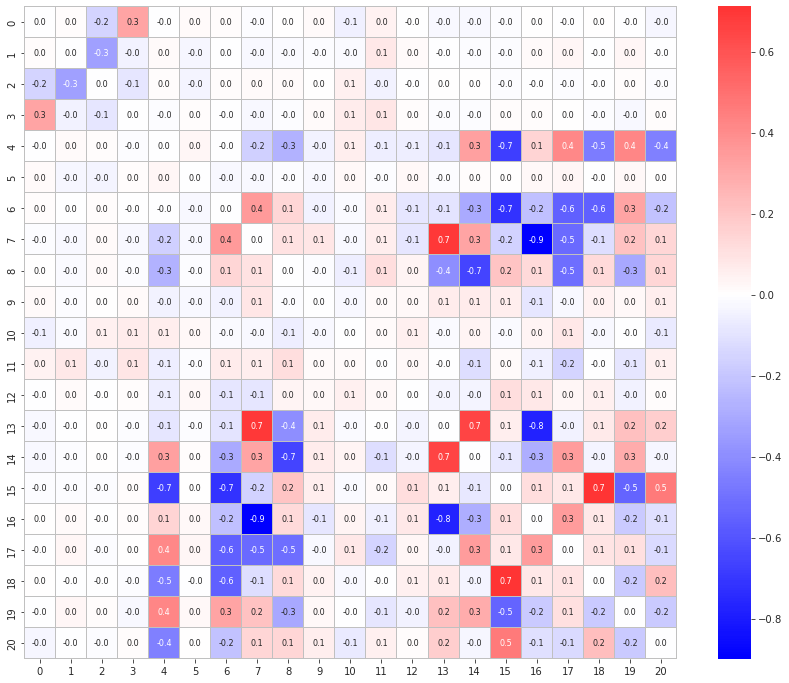

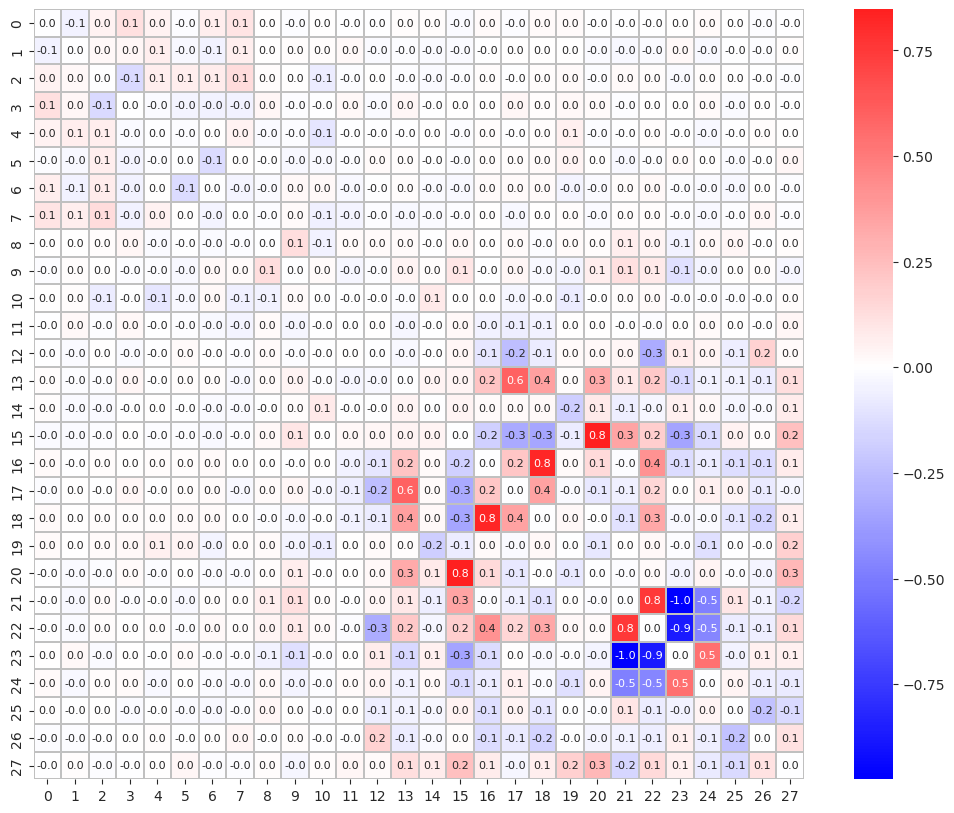

In [55]:
# create datasets
f = pjoin(tr.model.cfg.data_dir, tr.model.cfg.h_pre)
f = h5py.File(f, mode='r')
fix = np.array(f['vld']['fix'], dtype=float)
pos_obj = np.array(f['vld']['pos_obj'], dtype=float)
vel_obj = np.array(f['vld']['vel_obj'], dtype=float)
vel_slf = np.array(f['vld']['vel_slf'], dtype=float)
f.close()

In [56]:
pos = dc(pos_obj)
pos[0] -= fix[:, 0]
pos[1] -= fix[:, 1]

In [57]:
g = np_nans((len(fix), 11))
g[:, :2] = fix
g[:, 2:5] = vel_slf.T
g[:, 5:8] = vel_obj.T
g[:, 8:11] = pos.T
g.shape

(7500, 11)

In [58]:
u_g, s_g, v_g = sp_lin.svd(g, full_matrices=False, compute_uv=True)
s_g *= 100 / s_g.sum()
u_g.shape, s_g.shape, v_g.shape

((7500, 11), (11,), (11, 11))

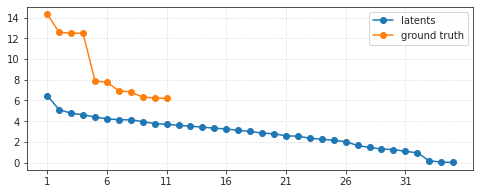

In [59]:
fig, ax = create_figure(figsize=(8, 3))
ax.plot(s, marker='o', label='latents')
ax.plot(s_g, marker='o', label='ground truth')
ax.set(xticks=ticks, xticklabels=ticklabels)
ax.legend()
ax.grid()

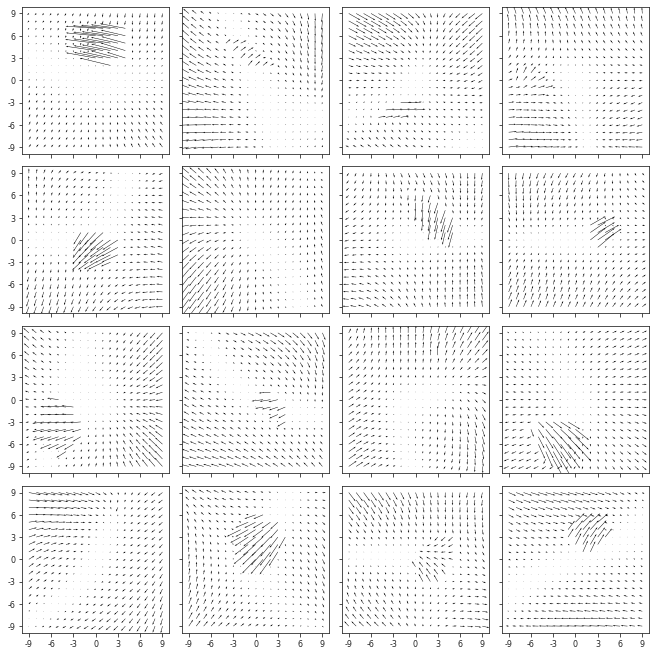

In [60]:
show_opticflow(val['x_sample'][2000:3000], 4);

In [62]:
num = 20
z_vld = np_nans((num, len(tr.dl_vld.dataset), tr.model.cfg.total_latents()))
z_tst = np_nans((num, len(tr.dl_tst.dataset), tr.model.cfg.total_latents()))

for i in tqdm(range(num)):
    z_vld[i] = tr.forward('vld', False)[0]['z']
    z_tst[i] = tr.forward('tst', False)[0]['z']

100%|██████████| 20/20 [01:37<00:00,  4.89s/it]


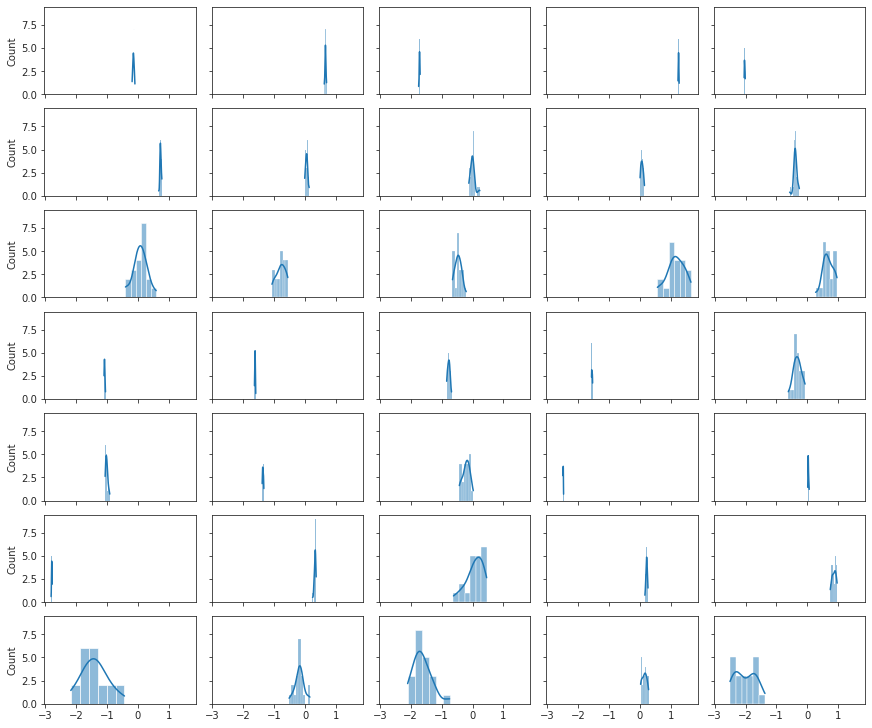

In [67]:
fig, axes = create_figure(
    7, tr.model.cfg.n_latent_per_group, (12, 10), 'all', 'all', constrained_layout=True)
for i, ax in enumerate(axes.flat):
    sns.histplot(z_vld[:, 500, i], kde=True, ax=ax)

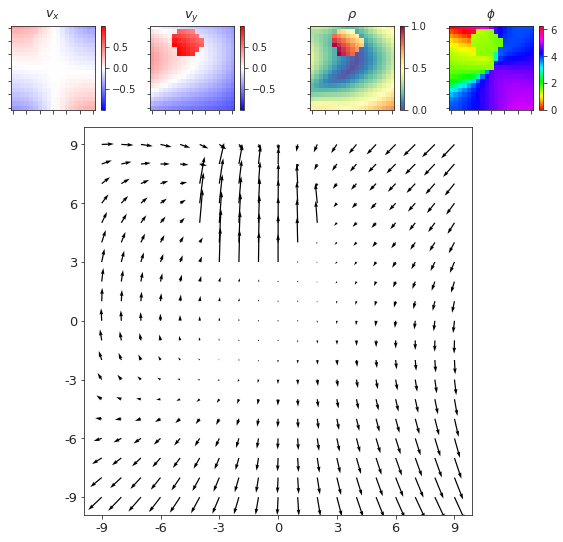

In [68]:
show_opticflow_full(val['x'][500]);

In [69]:
r = 1 - sp_dist.pdist(z_vld.mean(0).T, 'correlation')
r = sp_dist.squareform(r)

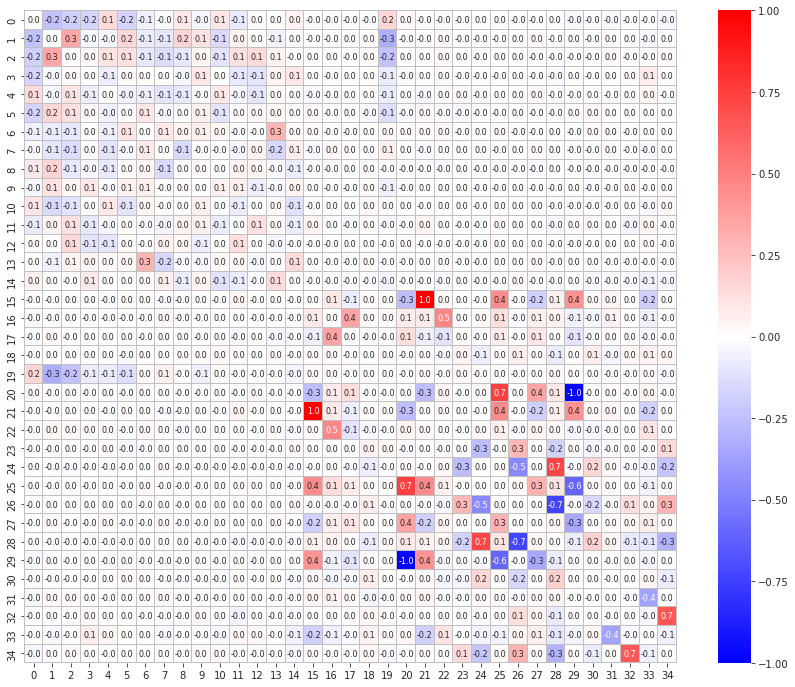

In [70]:
fig, ax = create_figure(1, 1, (15, 12))
sns.heatmap(
    r,
    vmin=-1,
    vmax=1,
    cmap='bwr',
    linewidths=0.005,
    linecolor='silver',
    square=True,
    annot=True,
    fmt='.1f',
    annot_kws={'fontsize': 8},
    ax=ax,
);

In [71]:
# create datasets
f = pjoin(tr.model.cfg.data_dir, tr.model.cfg.h_pre)
f = h5py.File(f, mode='r')
fix_vld = np.array(f['vld']['fix'], dtype=float)
pos_obj_vld = np.array(f['vld']['pos_obj'], dtype=float)
vel_obj_vld = np.array(f['vld']['vel_obj'], dtype=float)
vel_slf_vld = np.array(f['vld']['vel_slf'], dtype=float)
f.close()

pos_vld = dc(pos_obj_vld)
pos_vld[0] -= fix_vld[:, 0]
pos_vld[1] -= fix_vld[:, 1]
g_vld = np_nans((len(fix_vld), 11))
g_vld[:, :2] = fix_vld
g_vld[:, 2:5] = vel_slf_vld.T
g_vld[:, 5:8] = vel_obj_vld.T
g_vld[:, 8:11] = pos_vld.T
g_vld.shape

(7500, 11)

In [72]:
# create datasets
f = pjoin(tr.model.cfg.data_dir, tr.model.cfg.h_pre)
f = h5py.File(f, mode='r')
fix_tst = np.array(f['tst']['fix'], dtype=float)
pos_obj_tst = np.array(f['tst']['pos_obj'], dtype=float)
vel_obj_tst = np.array(f['tst']['vel_obj'], dtype=float)
vel_slf_tst = np.array(f['tst']['vel_slf'], dtype=float)
f.close()

pos_tst = dc(pos_obj_tst)
pos_tst[0] -= fix_tst[:, 0]
pos_tst[1] -= fix_tst[:, 1]
g_tst = np_nans((len(fix_tst), 11))
g_tst[:, :2] = fix_tst
g_tst[:, 2:5] = vel_slf_tst.T
g_tst[:, 5:8] = vel_obj_tst.T
g_tst[:, 8:11] = pos_tst.T
g_tst.shape

(2500, 11)

In [73]:
dim_names = {
    0: 'fix_x',
    1: 'fix_y',
    
    2: 'v_self_x',
    3: 'v_self_y',
    4: 'v_self_z',
    
    5: 'v_obj_x',
    6: 'v_obj_y',
    7: 'v_obj_z',
    
    8: 'pos_obj_x',
    9: 'pos_obj_y',
    10: 'pos_obj_z',
}

In [74]:
corr = 1 - sp_dist.pdist(g_vld.T, metric='correlation')
corr = sp_dist.squareform(corr)
corr.shape

(11, 11)

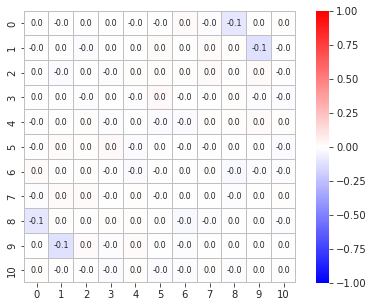

In [75]:
fig, ax = create_figure(1, 1, (7, 5))
sns.heatmap(
    corr,
    center=0,
    cmap='bwr',
    vmin=-1,
    vmax=1,
    linewidths=0.005,
    linecolor='silver',
    square=True,
    annot=True,
    fmt='.1f',
    annot_kws={'fontsize': 8},
    ax=ax,
);

In [76]:
u_g, s_g, v_g = sp_lin.svd(g_vld, full_matrices=False, compute_uv=True)
s_g *= 100 / s_g.sum()
u_g.shape, s_g.shape, v_g.shape

((7500, 11), (11,), (11, 11))

In [77]:
u, s, v = sp_lin.svd(z_vld.mean(0), full_matrices=False, compute_uv=True)
s *= 100 / s.sum()
u.shape, s.shape, v.shape

((7500, 35), (35,), (35, 35))

In [78]:
ticks = [
    i for i in range(tr.model.cfg.total_latents())
    if i % tr.model.cfg.n_latent_per_group == 0
]
ticklabels = [i + 1 for i in ticks]

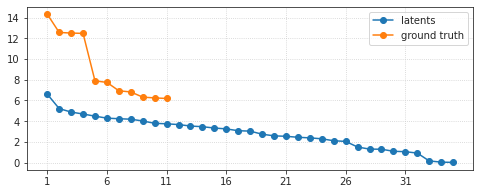

In [79]:
fig, ax = create_figure(figsize=(8, 3))
ax.plot(s, marker='o', label='latents')
ax.plot(s_g, marker='o', label='ground truth')
ax.set(xticks=ticks, xticklabels=ticklabels)
ax.legend()
ax.grid()

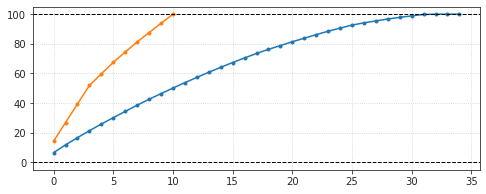

In [92]:
fig, ax = create_figure(figsize=(8, 3))
ax.plot(np.cumsum(s), marker='.')
ax.plot(np.cumsum(s_g), marker='.')
ax.axhline(0, color='k', ls='--', lw=1.0)
ax.axhline(100, color='k', ls='--', lw=1.0)
ax.grid()
plt.show()

In [109]:
from sklearn import linear_model

In [110]:
lr = linear_model.LinearRegression().fit(z_vld.mean(0), g_vld)
pred = lr.predict(z_tst.mean(0))
r = 1 - sp_dist.cdist(pred.T, g_tst.T, metric='correlation')
pred.shape, r.shape

((2500, 11), (11, 11))

In [1]:
fig, ax = create_figure(figsize=(12, 10))
sns.heatmap(
    r,
    cmap='PiYG',
    vmin=-1, 
    vmax=1,
    square=True,
    linewidth=0.01,
    annot=True,
    fmt='.1f',
    annot_kws={'fontsize': 12},
    ax=ax
)
_tx = [f"({i:02d})" for i in range(len(r))]
_ty = [f"{e} ({i:02d})" for i, e in dim_names.items()]
ax.set(xticklabels=_tx, yticklabels=_ty)
ax.tick_params(axis='x', rotation=-90)
ax.tick_params(axis='y', rotation=0)
ax.tick_params(axis='both', labelsize=14)
plt.show()

NameError: name 'create_figure' is not defined

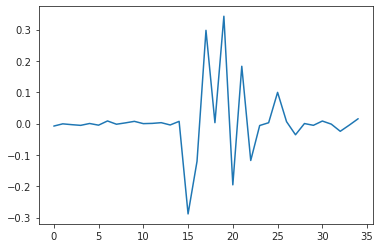

In [96]:
plt.plot(lr.coef_[5])

In [97]:
lr = linear_model.LinearRegression().fit(g_vld, z_vld.mean(0))
pred = lr.predict(g_tst)
r = 1 - sp_dist.cdist(pred.T, z_tst.mean(0).T, metric='correlation')
pred.shape, r.shape

((2500, 35), (35, 35))

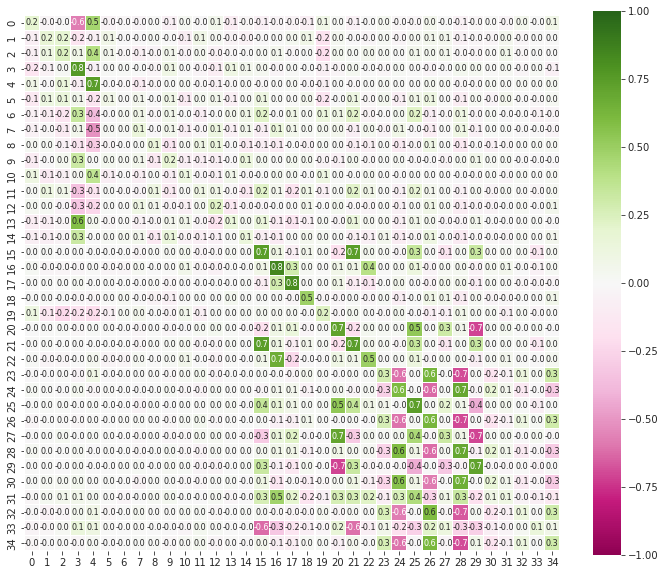

In [98]:
fig, ax = create_figure(figsize=(12, 10))
sns.heatmap(
    r,
    cmap='PiYG',
    vmin=-1, 
    vmax=1,
    square=True,
    linewidth=0.01,
    annot=True,
    fmt='.1f',
    annot_kws={'fontsize': 8},
    ax=ax
)
plt.show()

In [125]:
vars(lr)

{'fit_intercept': True,
 'normalize': 'deprecated',
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'n_features_in_': 35,
 'coef_': array([[-2.18570090e-03, -2.59592126e-03, -1.15389225e-02,
          5.64444299e-02,  1.19172094e-02, -5.65754753e-03,
         -8.17442421e-03, -3.92212147e-03,  3.72369530e-02,
         -5.13237205e-02,  1.62669208e-02,  2.20023472e-02,
          2.01507572e-02,  8.20003025e-03, -3.63662844e-02,
         -7.77073097e-01, -1.10785200e-02,  4.38862634e-03,
         -3.92732273e-03, -5.82938209e-01,  1.98454211e-01,
          8.13466119e-01,  1.72950876e-02,  1.50428378e-03,
          7.06772883e-03, -1.77596548e-01,  1.98863661e-03,
          4.89883113e-02, -5.30132788e-03, -6.34084039e-02,
          5.30599802e-03, -2.48630726e-04, -3.09760885e-03,
          2.61727970e-02,  4.47924373e-03],
        [ 1.24912585e-02, -4.97571548e-03, -4.45894339e-03,
         -7.61631137e-03,  5.81235643e-02,  1.46483902e-02,
          8.05811894e-03,  2.47247573e

In [130]:
lr.coef_.shape

(11, 35)

<AxesSubplot:>

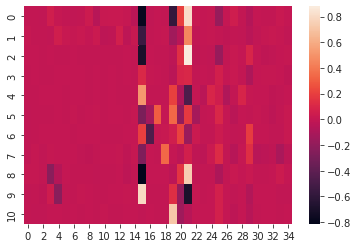

In [131]:
sns.heatmap(lr.coef_)

In [132]:
np.abs(lr.coef_).sum(0)

array([0.07434665, 0.05801439, 0.06713592, 0.35969673, 0.36510722,
       0.05423694, 0.04401463, 0.06156385, 0.0729674 , 0.11031075,
       0.06021131, 0.05733954, 0.11013665, 0.10132372, 0.092474  ,
       5.03259864, 0.61522552, 0.33422682, 0.38974499, 2.27872811,
       1.46987226, 4.60738618, 0.22621503, 0.08194198, 0.17246512,
       0.94629304, 0.1143101 , 0.24977782, 0.13093408, 0.78298627,
       0.07671217, 0.08264556, 0.12140875, 0.21706147, 0.11814359])

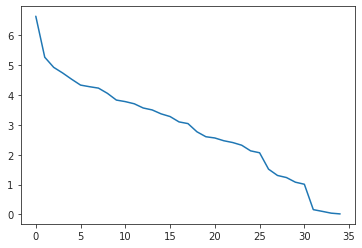

In [128]:
plt.plot(100 * lr.singular_ / lr.singular_.sum())

In [122]:
g_vld.shape[-1]

(7500, 11)

In [ ]:
mutual_info_regression(z_vld.mean(0), g_vld)

In [99]:
from sklearn.feature_selection import mutual_info_regression

In [101]:
mi = np.zeros((11, 35))
for i in range(11):
    mi[i] = mutual_info_regression(z_vld.mean(0), g_vld[:, i])

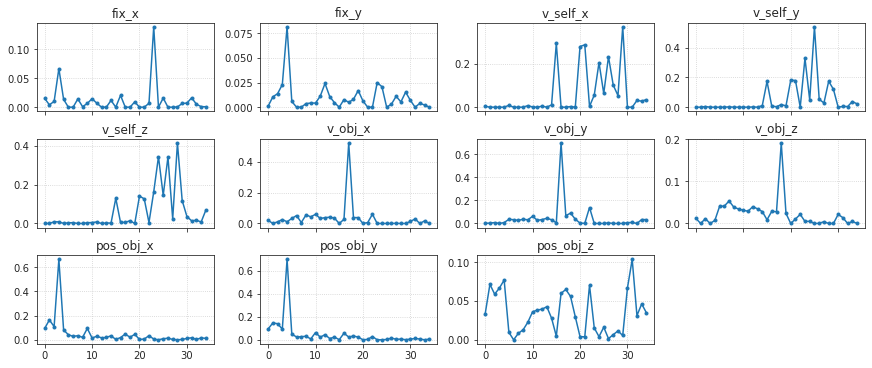

In [102]:
fig, axes = create_figure(3, 4, (12, 5), 'all', 'none', constrained_layout=True)
for i in range(11):
    ax = axes.flat[i]
    ax.plot(mi[i], marker='.')
    ax.set_title(dim_names[i])
    ax.grid()
trim_axs(axes, 11)
plt.show()

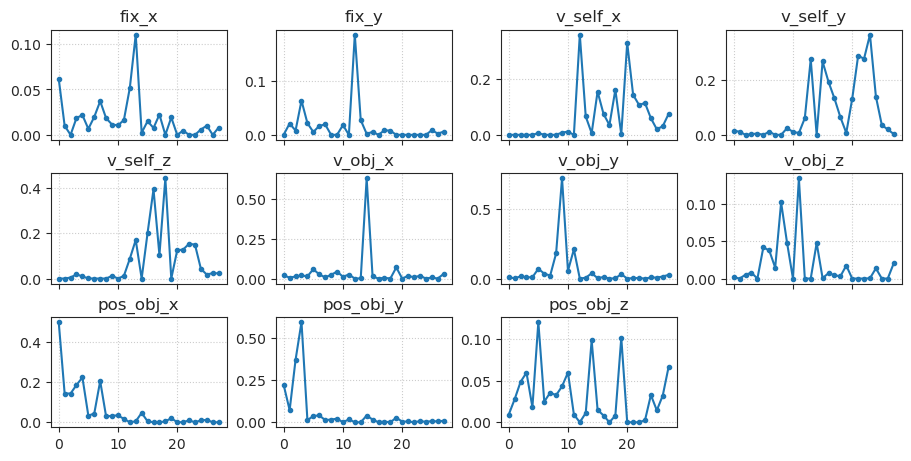

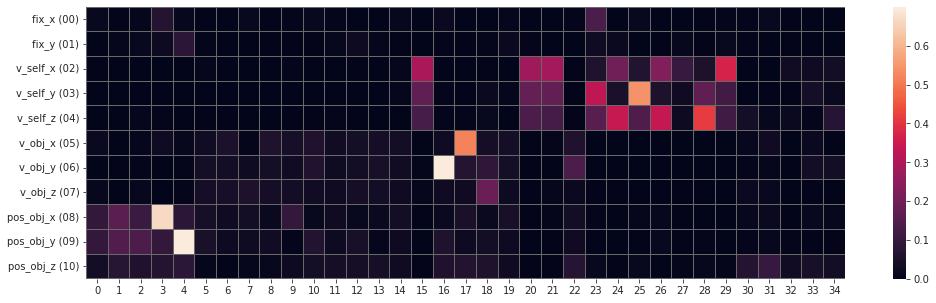

In [104]:
fig, ax = create_figure(figsize=(17, 5))
sns.heatmap(mi, vmin=0, linewidth=0.01, linecolor='dimgrey')
ax.set_yticklabels([f"{e} ({i:02d})" for i, e in dim_names.items()])
ax.tick_params(axis='y', rotation=0)
plt.show()

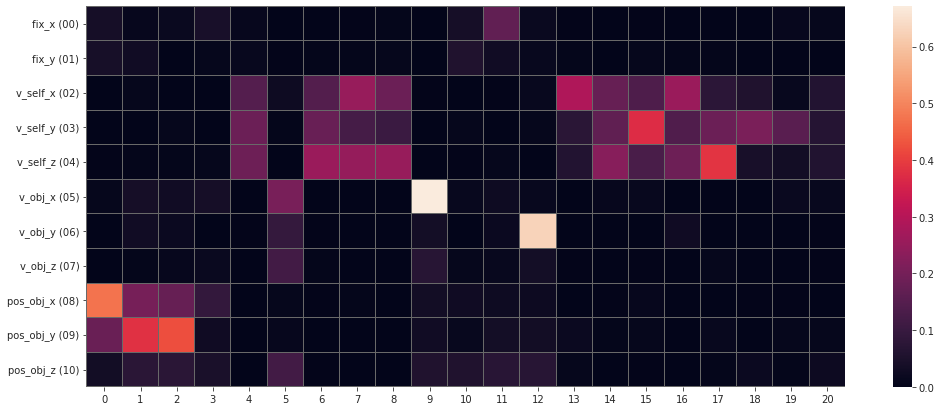

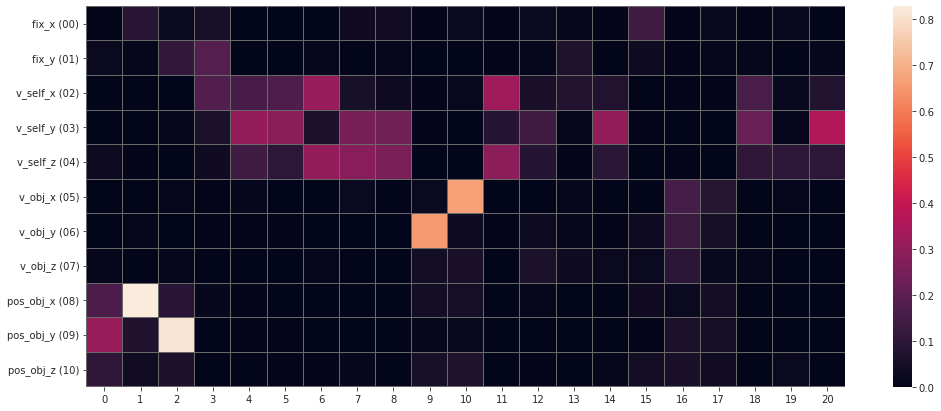

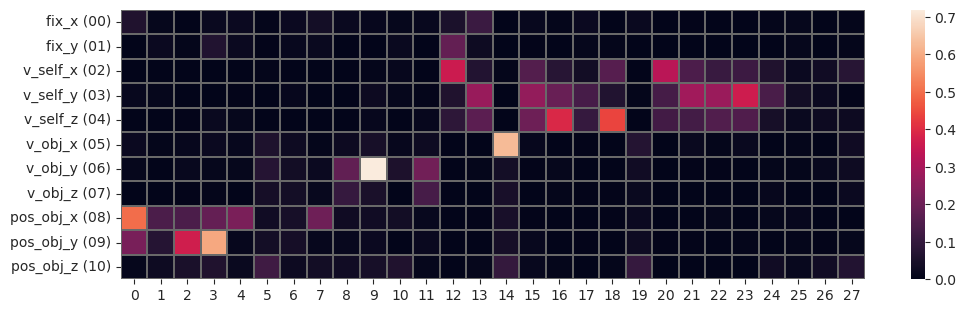

In [105]:
mi_normalzied = mi / mi.sum(1, keepdims=True)

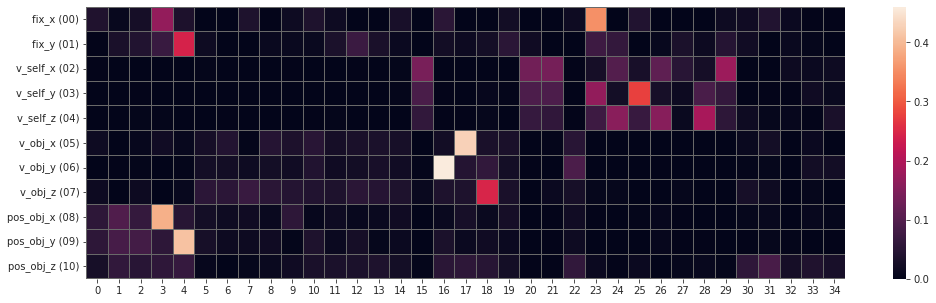

In [106]:
fig, ax = create_figure(figsize=(17, 5))
sns.heatmap(mi_normalzied, vmin=0, linewidth=0.01, linecolor='dimgrey')
ax.set_yticklabels([f"{e} ({i:02d})" for i, e in dim_names.items()])
ax.tick_params(axis='y', rotation=0)
plt.show()

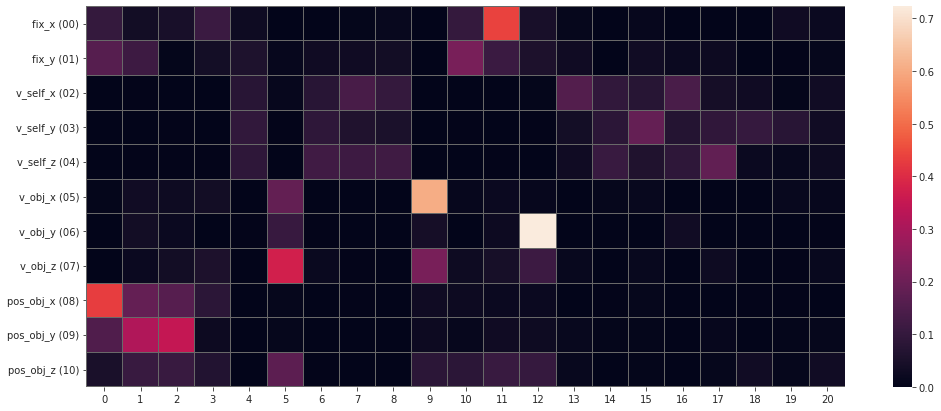

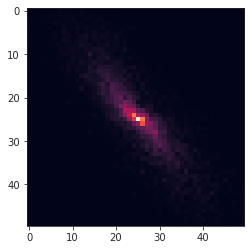

In [112]:
i, j = 5, 9
c_xy = np.histogram2d(g_vld[:, i], z_vld.mean(0)[:, j], 50)[0]
plt.imshow(c_xy);

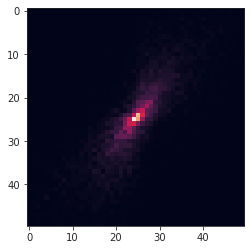

In [113]:
i, j = 6, 12
c_xy = np.histogram2d(g_vld[:, i], z_vld.mean(0)[:, j], 50)[0]
plt.imshow(c_xy);

In [114]:
fix = g_vld[:, :2]
fix = np.concatenate([
    fix,
    np.ones((len(fix), 1)),
], axis=1)
fix.shape

(7500, 3)

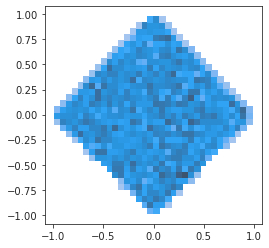

In [115]:
ax = sns.histplot(x=fix[:, 0], y=fix[:, 1])
ax_square(ax);

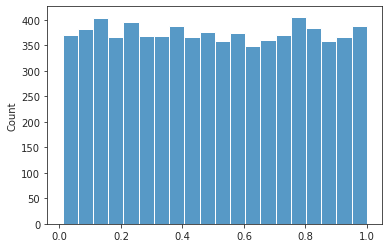

In [116]:
heading = g_vld[:, 2:5]
sns.histplot(cart2polar(heading)[:, 0]);

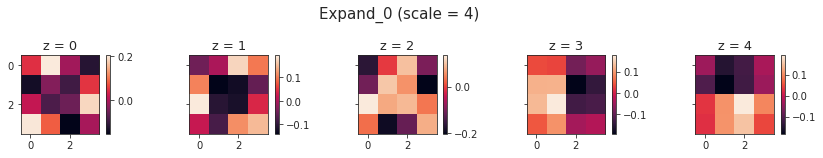

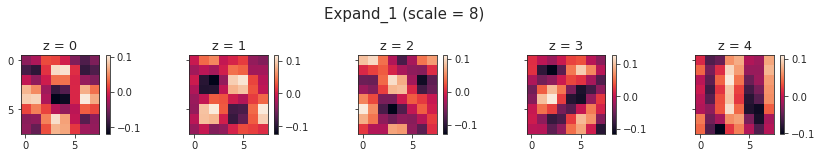

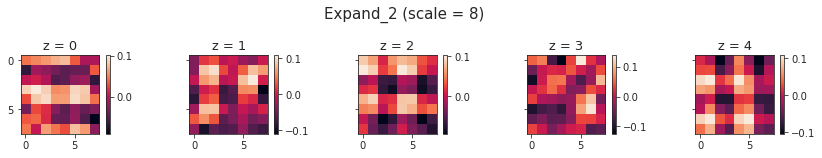

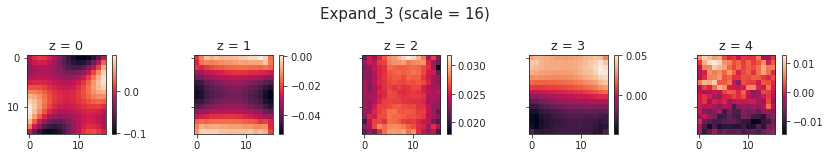

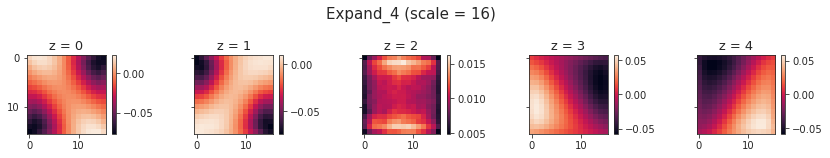

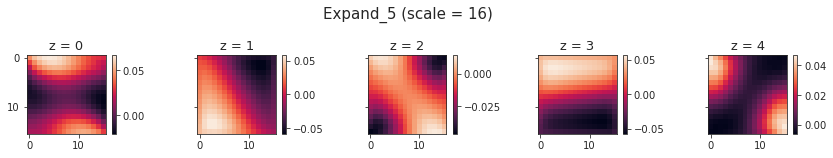

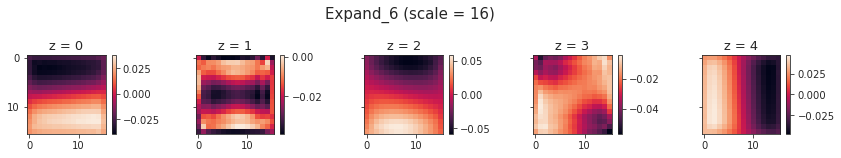

In [108]:
scales = vae.latent_scales()

for i, _w in w2p.items():
    num = tr.model.cfg.n_latent_per_group
    fig, axes = create_figure(1, num, (12, 2.0), 'all', 'all', tight_layout=True)
    for z in range(num):
        ax = axes.flat[z]
        im = ax.imshow(_w[z, 0])
        plt.colorbar(im, ax=ax)
        ax.set_title(f'z = {z}', fontsize=13)
    fig.suptitle(f'Expand_{i} (scale = {scales[i]})', fontsize=15, y=1.02)
    plt.show()